# Drug interaction prediction in *E. coli*
*Author: Vladislav Kim*
* [Introduction](#intro)
* [Compound class stratified validation](#classlockout)
* [Choose thresholds for interactions](#threshclass)
* [Precision-recall and ROC curves](#pr)
* [Probability calibration](#calib)
* [Predictions on the test set](#test)

In [1]:
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib
import tensorflow as tf
import numpy as np
import pandas as pd
import sys
import os
import itertools
from sklearn.preprocessing import label_binarize

sys.path.append('..')
import base.chemgen_utils as utl
import MLmod.predictor_modified as prd

In [2]:
from sklearn.model_selection import ParameterGrid
# # DL has 10 * 10 * 5 * 5 * 5 * 10 * 10 = 2880 combinations of hyperparameters
# DL_grid1 = {"learning_rate_deep": [0.001,0.005,0.01,0.1,1],
#              "layers": [1,3,5,7],
#              "nodes": [16,32,64,128],
#              "dropout": [0.1,0.3,0.5,0.7],
#              "steps": [32,64,128],
#              "epochs": [400, 600, 800]}
#              #"class_weight": {0:1, 1:2, 2:10}

#     # DL has 10 * 10 * 5 * 5 * 5 * 10 * 10 = 576 combinations of hyperparameters
# DL_grid2 = {"learning_rate_deep": [0.0001,0.001],
#              "layers": [1,3],
#              "nodes": [64,128,256],
#              "dropout": [0.1,0.5],
#              "steps": [64,128],
#              "beta_1": [0.8, 0.99],
#              "beta_2": [0.9, 0.99],
#              "epochs": [400, 600, 800]}
#              #"class_weight": {0:1, 1:2, 2:10} 

# DL has 10 * 10 * 5 * 5 * 5 * 10 * 10 = 1296 combinations of hyperparameters
DL_grid3 = {"learning_rate_deep": [0.0001,0.001],
             "layers": [1,3],
             "nodes": [64,128,256],
             "dropout": [0.1,0.3, 0.5],
             "steps": [64,128],
             "beta_1": [0.8, 0.9, 0.99],
             "beta_2": [0.9, 0.99,0.999],
             "epochs": [600, 800]}
             #"class_weight": {0:1, 1:2, 2:10}

pgrid = ParameterGrid(DL_grid3)
indices = np.array_split(np.arange(len(pgrid)), 1296)

print(pgrid[388])

{'steps': 64, 'nodes': 256, 'learning_rate_deep': 0.0001, 'layers': 1, 'epochs': 600, 'dropout': 0.5, 'beta_2': 0.999, 'beta_1': 0.8}


In [3]:
# import matplotlib.pyplot as plt
# from matplotlib import cm
# import matplotlib
# import tensorflow as tf
# import numpy as np
# import pandas as pd
# import sys
# import os
# import itertools
# from sklearn.preprocessing import label_binarize

# sys.path.append('..')
# import base.chemgen_utils as utl
# import MLmod.predictor_modified as prd

<a id="intro"></a> 
## Introduction
It has been previously shown that drug interactions can be predicted in bacteria using chemogenomic data. Here we use random forest classifier on single-compound chemical genetics data in *E. coli* to predict antagonisms, synergies and additive combinations. 

We encode our input predictor matrix as follows: 
+ For each combination load single-compound profiles. Each profile has dimensions `(1 x genes)` and the following possible gene states {-1,0,+1}. Negative drug-gene interaction (-1) implies increased sensitivity in that gene deletion, while positive gene state (+1) indicates decreased sensitivity in that mutant
+ Combination profiles are generaeted based on superposition of individual drug profiles and may take on the following gene states {-2, -1, 0, +1, +2, +/-}
+ We then use one-hot encoding scheme ("dummy variable encoding") before passing the predictor matrix `X` to the classifier

We furthermore subset the data so that only those genes are included that are significantly enriched in antagonisms and synergies based on chi-squared test. This gene list is `interaction-genes-Ecoli`

In [4]:
drugleg_fname = "../data/chemicals/legend_gramnegpos.txt"
gene_subset = '../data/interaction-genes-Ecoli'
gene_subset = pd.read_csv(gene_subset, header=None)[0].values

In [5]:
X_chemgen = pd.read_csv('../data/chemgenetics/nichols_signed.csv', index_col=0)
X_chemgen = X_chemgen.iloc[:,np.where(np.isin(X_chemgen.columns, gene_subset))[0]]
targets = pd.read_csv("../data/chemgenetics/nichols_y.csv")
combs = targets['comb'].values
y = targets['type'].values

X_df = pd.DataFrame([utl.get_comb_feat_signed(X_chemgen, c) for c in combs])

Since we are using `OneVsRestClassifier`, we convert our categorical response variable `y` ("synergy" ,"antagonism", "none") into a `n x 3` binary array using `label_binarize` function

In [6]:
# one vs rest classification
y[y=='none'] = 0
y[y=='antagonism']=1
y[y=='synergy']=2

y=y.astype('int')
y = label_binarize(y, classes=[0, 1, 2])

Encode combination profiles using one-hot encoding scheme:

In [7]:
X_onehot = pd.get_dummies(X_df.astype('category'))

In [8]:
X_onehot.iloc[:6,:12]

,ACRA_-2,ACRA_-1,ACRA_0,ACRA_1,ACRA_2,ACRA_3,ACRB_-2,ACRB_-1,ACRB_0,ACRB_1,ACRB_2,ACRB_3
0,0,0,1,0,0,0,0,0,0,1,0,0
1,0,1,0,0,0,0,0,0,0,0,0,1
2,0,0,1,0,0,0,0,0,0,1,0,0
3,0,1,0,0,0,0,0,0,0,0,0,1
4,0,1,0,0,0,0,0,0,0,0,0,1
5,0,0,1,0,0,0,0,0,0,1,0,0


In [9]:
# at least 5 combinations with that variable set
X_onehot = X_onehot.loc[:,(X_onehot.sum(axis=0) > 4)]

We performed grid search to find the best parameters for the `RandomForestClassifier`:

In [10]:
# best parameters when sorted by meanAP_syn, meanAP_antag
#param_dict = {'n_estimators': 200,
# 'min_samples_split': 6,
# 'min_samples_leaf': 2,
# 'max_depth': None,
# 'class_weight': {0: 1, 1: 1}}

In [11]:
# best parameters neural network
param_dict = {
'steps': 64,
'nodes': 256,
'learning_rate_deep': 0.0001,
'layers': 1,
'epochs': 600,
'dropout': 0.5,
'beta_2': 0.999,
'beta_1': 0.8,
'class_weight': None}

#{'steps': 64, 'nodes': 256, 'learning_rate_deep': 0.0001, 'layers': 1, 'epochs': 600, 'dropout': 0.5, 'beta_2': 0.999, 'beta_1': 0.8}

<a id="classlockout"></a> 
## Cross Validation
In order to assess the generalization error we generate 20 cross-validation folds by withholding 15 randomly chosen compounds.

In [12]:
'''from sklearn.model_selection import KFold, RepeatedKFold

kf = RepeatedKFold(n_splits=10, n_repeats=2, random_state=1401)
splits = kf.split(X=X_onehot.to_numpy(),y=y)'''

'from sklearn.model_selection import KFold, RepeatedKFold\n\nkf = RepeatedKFold(n_splits=10, n_repeats=2, random_state=1401)\nsplits = kf.split(X=X_onehot.to_numpy(),y=y)'

In [13]:
def generate_train_val(drugs, combs, n_holdout=15):
    val_drugs = np.random.choice(drugs, size=n_holdout)
    
    combs_val = list(itertools.combinations(val_drugs, 2))
    combs_val = [sorted(i) for i in combs_val]
    combs_val = np.array([i[0]+"_"+i[1] for i in combs_val])
    combs_val = np.intersect1d(combs_val, combs)
    combs_train = np.setdiff1d(combs, combs_val)
    
    assert((combs_train.shape[0] + combs_val.shape[0]) == combs.shape[0])
    train = np.where(np.isin(combs, combs_train))[0]
    val = np.where(np.isin(combs, combs_val))[0]
    return (train, val)

In [14]:
np.random.seed(1601)
# drugs in the chemical genetics dataset of E. coli
drugs = np.unique(X_chemgen.index)
# generate CV folds by withholding 15 randomly chosen drugs
splits = [generate_train_val(drugs, combs) for i in range(20)]

In each cross-validation iteration we withhold a random subset of drugs $(n=15)$ and test the trained model on the withheld combinations:

In [15]:
pr = prd.MultiClassPredictions(X=X_onehot.to_numpy(), y=y,
                                   combs=combs,
                                  **param_dict,
                                   clf='neural_network',
                                   top = 30)

In [16]:
pr.crossval_ksplit(splits=splits)

Validation set size in CV fold 1: 102
Epoch 1/600
64/64 [==============================] - 0s 2ms/step - loss: 0.9630 - accuracy: 0.5487
Epoch 2/600
64/64 [==============================] - 0s 2ms/step - loss: 0.6051 - accuracy: 0.7236
Epoch 3/600
64/64 [==============================] - 0s 2ms/step - loss: 0.6114 - accuracy: 0.6851
Epoch 4/600
64/64 [==============================] - 0s 2ms/step - loss: 0.5399 - accuracy: 0.7259
Epoch 5/600
64/64 [==============================] - 0s 2ms/step - loss: 0.5474 - accuracy: 0.7245
Epoch 6/600
64/64 [==============================] - 0s 2ms/step - loss: 0.4810 - accuracy: 0.7726
Epoch 7/600
64/64 [==============================] - 0s 2ms/step - loss: 0.4769 - accuracy: 0.7603
Epoch 8/600
64/64 [==============================] - 0s 2ms/step - loss: 0.4447 - accuracy: 0.8214
Epoch 9/600
64/64 [==============================] - 0s 2ms/step - loss: 0.4465 - accuracy: 0.7879
Epoch 10/600
64/64 [==============================] - 0s 2ms/step - los

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Validation set size in CV fold 2: 65
Epoch 1/600
64/64 [==============================] - 0s 1ms/step - loss: 0.8307 - accuracy: 0.6550
Epoch 2/600
64/64 [==============================] - 0s 2ms/step - loss: 0.6780 - accuracy: 0.6445
Epoch 3/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5864 - accuracy: 0.7322
Epoch 4/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5472 - accuracy: 0.7337
Epoch 5/600
64/64 [==============================] - 0s 2ms/step - loss: 0.5383 - accuracy: 0.7496
Epoch 6/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4864 - accuracy: 0.7747
Epoch 7/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4653 - accuracy: 0.7859
Epoch 8/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4599 - accuracy: 0.7785
Epoch 9/600
64/64 [==============================] - 0s 2ms/step - loss: 0.4898 - accuracy: 0.7747
Epoch 10/600
64/64 [==============================] - 0s 1ms/step - loss

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Validation set size in CV fold 3: 91
Epoch 1/600
64/64 [==============================] - 1s 1ms/step - loss: 0.8389 - accuracy: 0.6273
Epoch 2/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5825 - accuracy: 0.7294
Epoch 3/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5099 - accuracy: 0.7434
Epoch 4/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5119 - accuracy: 0.7728
Epoch 5/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5059 - accuracy: 0.7409
Epoch 6/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4826 - accuracy: 0.7709
Epoch 7/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4777 - accuracy: 0.7839
Epoch 8/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4610 - accuracy: 0.7875
Epoch 9/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4993 - accuracy: 0.7541
Epoch 10/600
64/64 [==============================] - 0s 1ms/step - loss

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Epoch 1/600
64/64 [==============================] - 1s 1ms/step - loss: 0.9515 - accuracy: 0.5380
Epoch 2/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5902 - accuracy: 0.7342
Epoch 3/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5338 - accuracy: 0.7422
Epoch 4/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4988 - accuracy: 0.7616
Epoch 5/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5057 - accuracy: 0.7568
Epoch 6/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4874 - accuracy: 0.7762
Epoch 7/600
64/64 [==============================] - 0s 2ms/step - loss: 0.4507 - accuracy: 0.7902
Epoch 8/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4472 - accuracy: 0.7945
Epoch 9/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4850 - accuracy: 0.7550
Epoch 10/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4602 - accuracy: 0.7811
Epoch 11/

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Validation set size in CV fold 5: 78
Epoch 1/600
64/64 [==============================] - 0s 1ms/step - loss: 1.0781 - accuracy: 0.4985
Epoch 2/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5885 - accuracy: 0.7079
Epoch 3/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5679 - accuracy: 0.7145
Epoch 4/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5168 - accuracy: 0.7628
Epoch 5/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5269 - accuracy: 0.7511
Epoch 6/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4768 - accuracy: 0.7769
Epoch 7/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4494 - accuracy: 0.8067
Epoch 8/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4988 - accuracy: 0.7604
Epoch 9/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4490 - accuracy: 0.8045
Epoch 10/600
64/64 [==============================] - 0s 1ms/step - loss

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Epoch 1/600
64/64 [==============================] - 0s 1ms/step - loss: 0.8836 - accuracy: 0.6005
Epoch 2/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5732 - accuracy: 0.7358
Epoch 3/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5580 - accuracy: 0.7357
Epoch 4/600
64/64 [==============================] - 0s 2ms/step - loss: 0.5425 - accuracy: 0.7364
Epoch 5/600
64/64 [==============================] - 0s 2ms/step - loss: 0.5285 - accuracy: 0.7589
Epoch 6/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4996 - accuracy: 0.7586
Epoch 7/600
64/64 [==============================] - 0s 2ms/step - loss: 0.4637 - accuracy: 0.7777
Epoch 8/600
64/64 [==============================] - 0s 2ms/step - loss: 0.4574 - accuracy: 0.8002
Epoch 9/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4370 - accuracy: 0.8016
Epoch 10/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4650 - accuracy: 0.7962
Epoch 11/

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Epoch 1/600
64/64 [==============================] - 1s 975us/step - loss: 0.7805 - accuracy: 0.6406
Epoch 2/600
64/64 [==============================] - 0s 1ms/step - loss: 0.6230 - accuracy: 0.6781
Epoch 3/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5295 - accuracy: 0.7476
Epoch 4/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5546 - accuracy: 0.7174
Epoch 5/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5084 - accuracy: 0.7574
Epoch 6/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5141 - accuracy: 0.7533
Epoch 7/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4936 - accuracy: 0.7647
Epoch 8/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4738 - accuracy: 0.7830
Epoch 9/600
64/64 [==============================] - 0s 996us/step - loss: 0.4862 - accuracy: 0.7768
Epoch 10/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4577 - accuracy: 0.7975
Epoch

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Validation set size in CV fold 8: 66
Epoch 1/600
64/64 [==============================] - 0s 1ms/step - loss: 0.9837 - accuracy: 0.5571
Epoch 2/600
64/64 [==============================] - 0s 1ms/step - loss: 0.6134 - accuracy: 0.6848
Epoch 3/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5943 - accuracy: 0.7047
Epoch 4/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5090 - accuracy: 0.7518
Epoch 5/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5224 - accuracy: 0.7456
Epoch 6/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5232 - accuracy: 0.7597
Epoch 7/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4754 - accuracy: 0.7848
Epoch 8/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4744 - accuracy: 0.7871
Epoch 9/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4661 - accuracy: 0.7807
Epoch 10/600
64/64 [==============================] - 0s 1ms/step - loss

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Validation set size in CV fold 9: 90
Epoch 1/600
64/64 [==============================] - 0s 2ms/step - loss: 0.8984 - accuracy: 0.5760
Epoch 2/600
64/64 [==============================] - 0s 2ms/step - loss: 0.6472 - accuracy: 0.6871
Epoch 3/600
64/64 [==============================] - 0s 2ms/step - loss: 0.5745 - accuracy: 0.7151
Epoch 4/600
64/64 [==============================] - 0s 2ms/step - loss: 0.5278 - accuracy: 0.7429
Epoch 5/600
64/64 [==============================] - 0s 2ms/step - loss: 0.5117 - accuracy: 0.7538
Epoch 6/600
64/64 [==============================] - 0s 2ms/step - loss: 0.5210 - accuracy: 0.7492
Epoch 7/600
64/64 [==============================] - 0s 2ms/step - loss: 0.5127 - accuracy: 0.7602
Epoch 8/600
64/64 [==============================] - 0s 7ms/step - loss: 0.4817 - accuracy: 0.7471
Epoch 9/600
64/64 [==============================] - 0s 2ms/step - loss: 0.4410 - accuracy: 0.7870
Epoch 10/600
64/64 [==============================] - 0s 2ms/step - loss

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Epoch 1/600
64/64 [==============================] - 0s 1ms/step - loss: 0.8973 - accuracy: 0.5763
Epoch 2/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5681 - accuracy: 0.7196
Epoch 3/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5319 - accuracy: 0.7266
Epoch 4/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5191 - accuracy: 0.7522
Epoch 5/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5038 - accuracy: 0.7415
Epoch 6/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4916 - accuracy: 0.7678
Epoch 7/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4851 - accuracy: 0.7809
Epoch 8/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5156 - accuracy: 0.7383
Epoch 9/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4425 - accuracy: 0.7857
Epoch 10/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4321 - accuracy: 0.7961
Epoch 11/

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Validation set size in CV fold 11: 78
Epoch 1/600
64/64 [==============================] - 1s 1ms/step - loss: 0.8220 - accuracy: 0.6149
Epoch 2/600
64/64 [==============================] - 0s 1ms/step - loss: 0.6047 - accuracy: 0.7049
Epoch 3/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5608 - accuracy: 0.7368
Epoch 4/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5073 - accuracy: 0.7565
Epoch 5/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5157 - accuracy: 0.7548
Epoch 6/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4910 - accuracy: 0.7638
Epoch 7/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4583 - accuracy: 0.7961
Epoch 8/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4782 - accuracy: 0.7629
Epoch 9/600
64/64 [==============================] - 0s 2ms/step - loss: 0.4603 - accuracy: 0.7839
Epoch 10/600
64/64 [==============================] - 0s 1ms/step - los

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Validation set size in CV fold 12: 91
Epoch 1/600
64/64 [==============================] - 0s 1ms/step - loss: 0.8039 - accuracy: 0.6558
Epoch 2/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5870 - accuracy: 0.7035
Epoch 3/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5375 - accuracy: 0.7491
Epoch 4/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5159 - accuracy: 0.7562
Epoch 5/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5035 - accuracy: 0.7599
Epoch 6/600
64/64 [==============================] - 0s 2ms/step - loss: 0.4997 - accuracy: 0.7502
Epoch 7/600
64/64 [==============================] - 0s 2ms/step - loss: 0.4985 - accuracy: 0.7695
Epoch 8/600
64/64 [==============================] - 0s 2ms/step - loss: 0.4689 - accuracy: 0.7771
Epoch 9/600
64/64 [==============================] - 0s 2ms/step - loss: 0.4437 - accuracy: 0.8100
Epoch 10/600
64/64 [==============================] - 0s 1ms/step - los

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Validation set size in CV fold 13: 78
Epoch 1/600
64/64 [==============================] - 0s 1ms/step - loss: 0.8570 - accuracy: 0.6065
Epoch 2/600
64/64 [==============================] - 0s 1ms/step - loss: 0.6153 - accuracy: 0.6738
Epoch 3/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5312 - accuracy: 0.7255
Epoch 4/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5213 - accuracy: 0.7410
Epoch 5/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5088 - accuracy: 0.7647
Epoch 6/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4851 - accuracy: 0.7712
Epoch 7/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4857 - accuracy: 0.7563
Epoch 8/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4326 - accuracy: 0.8162
Epoch 9/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4751 - accuracy: 0.7769
Epoch 10/600
64/64 [==============================] - 0s 1ms/step - los

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Epoch 1/600
64/64 [==============================] - 0s 1ms/step - loss: 0.8624 - accuracy: 0.5783
Epoch 2/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5739 - accuracy: 0.7191
Epoch 3/600
64/64 [==============================] - 0s 2ms/step - loss: 0.5464 - accuracy: 0.7319
Epoch 4/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4961 - accuracy: 0.7601
Epoch 5/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5007 - accuracy: 0.7548
Epoch 6/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4575 - accuracy: 0.7855
Epoch 7/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4911 - accuracy: 0.7824
Epoch 8/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4321 - accuracy: 0.8079
Epoch 9/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4129 - accuracy: 0.8240
Epoch 10/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4156 - accuracy: 0.8116
Epoch 11/

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Epoch 1/600
64/64 [==============================] - 0s 1ms/step - loss: 0.7673 - accuracy: 0.6620
Epoch 2/600
64/64 [==============================] - 0s 1ms/step - loss: 0.6100 - accuracy: 0.6991
Epoch 3/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5326 - accuracy: 0.7445
Epoch 4/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5239 - accuracy: 0.7399
Epoch 5/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4982 - accuracy: 0.7795
Epoch 6/600
64/64 [==============================] - 0s 2ms/step - loss: 0.4854 - accuracy: 0.7773
Epoch 7/600
64/64 [==============================] - 0s 2ms/step - loss: 0.4879 - accuracy: 0.7649
Epoch 8/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4866 - accuracy: 0.7703
Epoch 9/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4697 - accuracy: 0.7809
Epoch 10/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4551 - accuracy: 0.7959
Epoch 11/

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Epoch 1/600
64/64 [==============================] - 0s 1ms/step - loss: 0.8275 - accuracy: 0.6373
Epoch 2/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5882 - accuracy: 0.7295
Epoch 3/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5378 - accuracy: 0.7508
Epoch 4/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4873 - accuracy: 0.7819
Epoch 5/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5552 - accuracy: 0.7330
Epoch 6/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4490 - accuracy: 0.8033
Epoch 7/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4935 - accuracy: 0.7692
Epoch 8/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4456 - accuracy: 0.8048
Epoch 9/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4137 - accuracy: 0.8259
Epoch 10/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4155 - accuracy: 0.8166
Epoch 11/

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Epoch 1/600
64/64 [==============================] - 0s 1ms/step - loss: 0.8018 - accuracy: 0.6055
Epoch 2/600
64/64 [==============================] - 0s 1ms/step - loss: 0.6166 - accuracy: 0.6698
Epoch 3/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5544 - accuracy: 0.7443
Epoch 4/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5372 - accuracy: 0.7248
Epoch 5/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5330 - accuracy: 0.7426
Epoch 6/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4956 - accuracy: 0.7558
Epoch 7/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4640 - accuracy: 0.7694
Epoch 8/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4804 - accuracy: 0.7621
Epoch 9/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4590 - accuracy: 0.7840
Epoch 10/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4271 - accuracy: 0.8084
Epoch 11/

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Epoch 1/600
64/64 [==============================] - 0s 1ms/step - loss: 0.8046 - accuracy: 0.5942
Epoch 2/600
64/64 [==============================] - 0s 1ms/step - loss: 0.6125 - accuracy: 0.7131
Epoch 3/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5490 - accuracy: 0.7154
Epoch 4/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5374 - accuracy: 0.7363
Epoch 5/600
64/64 [==============================] - 0s 2ms/step - loss: 0.5111 - accuracy: 0.7590
Epoch 6/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4487 - accuracy: 0.7896
Epoch 7/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5106 - accuracy: 0.7781
Epoch 8/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4525 - accuracy: 0.7807
Epoch 9/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4332 - accuracy: 0.8013
Epoch 10/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4416 - accuracy: 0.8191
Epoch 11/

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Validation set size in CV fold 19: 91
Epoch 1/600
64/64 [==============================] - 0s 1ms/step - loss: 1.0277 - accuracy: 0.4798
Epoch 2/600
64/64 [==============================] - 0s 1ms/step - loss: 0.6159 - accuracy: 0.7249
Epoch 3/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5292 - accuracy: 0.7555
Epoch 4/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5360 - accuracy: 0.7459
Epoch 5/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5044 - accuracy: 0.7659
Epoch 6/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5385 - accuracy: 0.7419
Epoch 7/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4787 - accuracy: 0.7870
Epoch 8/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4890 - accuracy: 0.7904
Epoch 9/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4930 - accuracy: 0.7736
Epoch 10/600
64/64 [==============================] - 0s 1ms/step - los

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Epoch 1/600
64/64 [==============================] - 0s 1ms/step - loss: 0.9593 - accuracy: 0.5280
Epoch 2/600
64/64 [==============================] - 0s 1ms/step - loss: 0.6209 - accuracy: 0.6879
Epoch 3/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5604 - accuracy: 0.7172
Epoch 4/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5471 - accuracy: 0.7188
Epoch 5/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5032 - accuracy: 0.7525
Epoch 6/600
64/64 [==============================] - 0s 1ms/step - loss: 0.5036 - accuracy: 0.7602
Epoch 7/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4670 - accuracy: 0.7968
Epoch 8/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4432 - accuracy: 0.7921
Epoch 9/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4245 - accuracy: 0.8103
Epoch 10/600
64/64 [==============================] - 0s 1ms/step - loss: 0.4407 - accuracy: 0.8023
Epoch 11/

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


In [17]:
'''pr.save_topfeat(outdir='../data/chemgenetics/', 
                fname="topfeat-multiclass-Nichols-signed",
                    featname=X_onehot.columns.values)'''

'pr.save_topfeat(outdir=\'../data/chemgenetics/\', \n                fname="topfeat-multiclass-Nichols-signed",\n                    featname=X_onehot.columns.values)'

In [18]:
auc_df = pr.aggregate_auc()
ap_df = pr.aggregate_precision()
metrics = pd.merge(auc_df, ap_df, on='cvfold', how='inner')

This table shows the cross-validation results sorted by average precision for antagonism prediction:

In [19]:
(metrics.
 sort_values('AP_antag', ascending=False).
 reset_index(drop=True))

,cvfold,AUCROC_none,AUCROC_antag,AUCROC_syn,AP_none,AP_antag,AP_syn
0,3,0.662434,0.935673,0.597222,0.755450,0.732116,0.384265
1,6,0.878868,0.895161,0.658615,0.909926,0.710418,0.458977
2,14,0.798663,0.907366,0.609658,0.923120,0.672774,0.167698
3,13,0.703226,0.808426,0.768089,0.764861,0.596076,0.395617
4,1,0.726716,0.852201,0.750000,0.833716,0.570605,0.202198
5,2,0.843169,0.832602,0.814773,0.915802,0.548209,0.511106
6,5,0.668550,0.904082,0.723140,0.830301,0.533555,0.444869
7,11,0.769026,0.851852,0.685241,0.916283,0.513150,0.272491
8,9,0.733212,0.744898,0.647222,0.878499,0.511405,0.157950
9,10,0.814349,0.771169,0.804412,0.899013,0.454998,0.532731


We can do the same for synergy prediction - arrange the table by average precision:

In [20]:
(metrics.
 sort_values('AP_syn', ascending=False).
 reset_index(drop=True))

,cvfold,AUCROC_none,AUCROC_antag,AUCROC_syn,AP_none,AP_antag,AP_syn
0,19,0.672857,0.711289,0.877797,0.870158,0.231793,0.591080
1,17,0.735294,0.815217,0.770370,0.845789,0.376653,0.582292
2,15,0.640437,0.689474,0.782456,0.765663,0.239249,0.555494
3,18,0.812401,0.738095,0.783951,0.947207,0.194398,0.533640
4,10,0.814349,0.771169,0.804412,0.899013,0.454998,0.532731
5,7,0.733750,0.801453,0.851852,0.848763,0.366111,0.531719
6,2,0.843169,0.832602,0.814773,0.915802,0.548209,0.511106
7,4,0.765422,0.700136,0.822252,0.897149,0.223180,0.502414
8,6,0.878868,0.895161,0.658615,0.909926,0.710418,0.458977
9,16,0.678102,0.764706,0.775132,0.846551,0.334807,0.458794


We can check the most important genetic features and rank them by the number of cross-validation folds in which these appeared as top 30 features based on the splitting criterion (Gini impurity):

In [21]:
# topvars = (pd.concat(pr.topfeat).
#                    reset_index().
#                    rename(columns={"level_0": "cvfold"}).
#                    drop(columns=['level_1']))

In [22]:
# featname=X_onehot.columns.values

In [23]:
# topvars = (topvars.assign(feature=featname[topvars.feat]).
#            drop(columns=['feat']))

**Top genes for antagonism prediction**

In [24]:
# (topvars[topvars.type == 'antag'].
#  groupby('feature').agg('count').
#  query('cvfold > 1').
#  sort_values('cvfold', ascending=False).iloc[:30,0])

**Top genes for synergy prediction**

In [25]:
# (topvars[topvars.type == 'syn'].
#  groupby('feature').agg('count').
#  query('cvfold > 1').
#  sort_values('cvfold', ascending=False).iloc[:30,0])

<a id="threshclass"></a> 
## Choose Thresholds for Antagonisms and Synergies
The 'probability' score $p_{RF}$ output by random forests does not correspond to the probability of being a synergy or antagonism, i.e. 
$$p_{RF}(c=C|X) \neq P(c=C|X)$$

By construction random forests do not approximate class probabilities (unlike logistic regression e.g.) and due to class imbalance (80% additive combinations, 10% synergies, 10% antagonisms) almost all combinations are predicted to be neutral if one takes 
$$ \hat{C} = \mathrm{argmax} (p_{RF}(c|X)) $$

Since we are using `OneVsRestClassifier` however, we have technically 3 different binary classifiers, one for each combination type. We can use precision-recall characteristics in cross-validation folds to find thresholds for $p_{RF}(c=\mathrm{antagonism}|X)$ and $p_{RF}(c=\mathrm{synergy}|X)$.

In each cross-validation fold select thresholds such that precision > 0.6:

In [26]:
# choose prob score cutoff such that precision > 0.6
prec_thresh = 0.6

In [27]:
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score
from sklearn.metrics import precision_score

TP_df = list()
for cl in pr.predicted.keys():
    # print(cl)
    ycl = y[np.isin(combs, pr.predicted[cl]['comb'].values)]
    gt = pd.DataFrame(ycl, columns=['none', 'antagonism', 'synergy'])
    gt['comb'] = combs[np.isin(combs, pr.predicted[cl]['comb'].values)]
    pred_df = pd.merge(left=pr.predicted[cl], right=gt, how='inner', on='comb')
    
    precision, recall, thresh = precision_recall_curve(pred_df['antagonism'].values,
                                                        pred_df['score_antag'].values)
    if np.any(precision > prec_thresh):
        # maximum recall
        rmax = np.max(recall[precision > prec_thresh])
        # maximum precision
        pmax = np.max(precision[recall == rmax])
        # index with maximum recall and precision > prec_thresh
        idx = np.where(np.logical_and(precision == pmax, recall == rmax))[0][0]
        # corresponding threshold
        antag_thresh = thresh[idx] if idx < len(thresh) else thresh[-1]
        antag_tp = pred_df[(pred_df.score_antag > antag_thresh) == pred_df.antagonism]
        antag_tp = antag_tp[antag_tp.antagonism == 1]
        antag_tp['thresh'] = antag_thresh
        antag_tp['precision'] = pmax
        antag_tp['recall'] = rmax
        antag_tp['cvfold'] = cl
        TP_df.append(antag_tp)
    
    precision, recall, thresh = precision_recall_curve(pred_df['synergy'].values,
                                                        pred_df['score_syn'].values)
    if np.any(precision > prec_thresh):
        # maximum recall
        rmax = np.max(recall[precision > prec_thresh])
        # maximum precision
        pmax = np.max(precision[recall == rmax])
        # index with maximum recall and precision > prec_thresh
        idx = np.where(np.logical_and(precision == pmax, recall == rmax))[0][0]
        # corresponding threshold
        syn_thresh = thresh[idx] if idx < len(thresh) else thresh[-1]

        syn_tp = pred_df[(pred_df.score_syn > syn_thresh) == pred_df.synergy]
        syn_tp = syn_tp[syn_tp.synergy == 1]
        syn_tp['thresh'] = syn_thresh
        syn_tp['precision'] = pmax
        syn_tp['recall'] = rmax
        syn_tp['cvfold'] = cl
        TP_df.append(syn_tp)

In [28]:
TP_df = pd.concat(TP_df).reset_index(drop=True)

Thresholds to call antagonisms across cross-validation folds:

In [29]:
np.unique(TP_df[TP_df['antagonism']==1]['thresh'].values)

array([0.01501808, 0.015388  , 0.05028173, 0.18027659, 0.2883814 ,
       0.5500063 , 0.8124359 , 0.90861875, 0.9953323 , 0.9992513 ,
       0.9999987 ], dtype=float32)

As we can see in most cases we end up with precision greater than 0.6 if we take a cutoff between 0.2-0.6. This already suggests  that $p_{RF}$ cannot be interpreted as probability $P(C|X)$ as we will see again in [Probability calibration](#calib) section. We can take the median as a cutoff for calling antagonisms:

In [30]:
antag_thresh = np.median(np.unique(TP_df[TP_df['antagonism']==1]['thresh'].values))
antag_thresh

0.5500063

Thresholds to call synergies in cross-validation:

In [31]:
np.unique(TP_df[TP_df['synergy']==1]['thresh'].values)

array([0.17796384, 0.3515669 , 0.35538328, 0.38029143, 0.40730545,
       0.86468923, 0.9451039 , 0.9489548 , 0.96869475, 0.9700991 ,
       0.9991831 , 0.9996797 , 0.9999752 ], dtype=float32)

Again we achieve precision greater than 0.6 if we take relatively loose cutoffs between 0.15-0.45. We'll take the median as our threshold for calling synergies:

In [32]:
syn_thresh = np.median(np.unique(TP_df[TP_df['synergy']==1]['thresh'].values))
syn_thresh

0.9451039

In [33]:
#TP_df.to_csv('Nichols-true-positives-CVfold.csv')

<a id="pr"></a> 
## Plot Precision-Recall and ROC curves

In [34]:
keys = list(pr.auc.keys())

Add only mean average precision:

In [35]:
preds_ = (pd.concat(pr.predicted).
                  reset_index().
                  rename(columns={"level_0": "cvfold"}).
                  drop(columns=['level_1']))

In [36]:
y_gt = targets.loc[:, ['comb', 'type']]
y_gt['syn'] = 0
y_gt['ant'] = 0
y_gt.loc[y_gt.type == 1,'ant'] = 1
y_gt.loc[y_gt.type == 2,'syn'] = 1

In [37]:
pred_vs_true = pd.merge(preds_, y_gt, on='comb')

In [38]:
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score

# A "micro-average": quantifying score on all classes jointly
prec_micro, recall_micro, _ = precision_recall_curve(pred_vs_true['ant'].values,
                                                    pred_vs_true['score_antag'].values)
ap_micro = average_precision_score(pred_vs_true['ant'].values,
                                   pred_vs_true['score_antag'].values,
                                   average="micro")

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


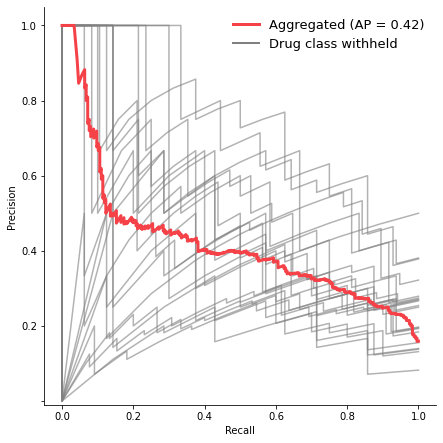

In [39]:
from matplotlib.lines import Line2D
fig, ax = plt.subplots(figsize=(6.5,6.5))

font = {'family': 'normal',
        'weight': 'normal',
        'size': 18}
matplotlib.rc('font', **font)
for cl in keys:
    plt.plot(pr.recall[cl][1], pr.precision[cl][1],
             color='grey', lw=1.5, alpha=0.6)
    plt.xlim([-0.05, 1.05])
plt.plot(recall_micro, prec_micro,
        label='Aggregated (AP = {0:0.2f})'
               ''.format(ap_micro),
         color='#f54248', linestyle='-', linewidth=3)

handles, labels = ax.get_legend_handles_labels()
patch = Line2D([0], [0], color='grey', linewidth=2, linestyle="-",
               label='Drug class withheld')
handles.append(patch) 
plt.ylim([-0.01, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
#ax.yaxis.get_major_ticks()[0].label1.set_visible(False)
ax.yaxis.get_major_ticks()[1].label1.set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#plt.title(title)
plt.legend(handles=handles, loc='upper right', prop={"size": 13},
          frameon=False)
plt.tight_layout()
#plt.savefig('Ecoli-antagonism-vs-rest-grey.pdf')

In [40]:
# A "micro-average": quantifying score on all classes jointly
prec_micro, recall_micro, _ = precision_recall_curve(pred_vs_true['syn'].values,
                                                    pred_vs_true['score_syn'].values)
ap_micro = average_precision_score(pred_vs_true['syn'].values,
                                   pred_vs_true['score_syn'].values,
                                   average="micro")

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


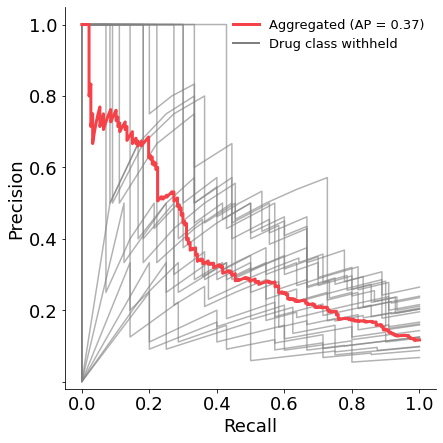

In [41]:
fig, ax = plt.subplots(figsize=(6.5,6.5))
for cl in keys:
    plt.plot(pr.recall[cl][2], pr.precision[cl][2],
            color='grey', lw=1.5, alpha=0.6)
    plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.plot(recall_micro, prec_micro,
        label='Aggregated (AP = {0:0.2f})'
               ''.format(ap_micro),
         color='#f54248', linestyle='-', linewidth=3)

handles, labels = ax.get_legend_handles_labels()
patch = Line2D([0], [0], color='grey', linewidth=2, linestyle="-",
               label='Drug class withheld')
handles.append(patch) 
plt.ylim([-0.02, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
ax.yaxis.get_major_ticks()[1].label1.set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#plt.title(title)
plt.legend(handles=handles, loc='upper right',
           prop={"size": 13},
            #bbox_to_anchor=(1.2,0.8),
          frameon=False)
#plt.legend([], frameon=False)
plt.tight_layout()
#plt.savefig('Ecoli-synergy-vs-rest-grey.pdf')

Plot ROC curves:

In [42]:
fpr_micro, tpr_micro, _ = roc_curve(pred_vs_true['ant'].values,
                                                    pred_vs_true['score_antag'].values)
roc_auc_micro = auc(fpr_micro, tpr_micro)

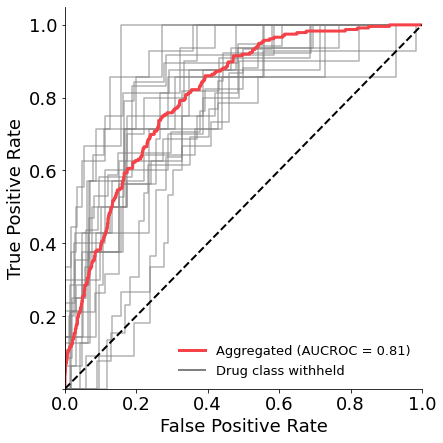

In [43]:
fig, ax = plt.subplots(figsize=(6.5,6.5))
for cl in keys:
    plt.plot(pr.fpr[cl][1], pr.tpr[cl][1],
             color='grey', lw=1.5, alpha=0.6)
plt.plot(fpr_micro, tpr_micro,
        label='Aggregated (AUCROC = {0:0.2f})'
               ''.format(roc_auc_micro),
         color='#f54248', linestyle='-', linewidth=3)

handles, labels = ax.get_legend_handles_labels()
patch = Line2D([0], [0], color='grey', linewidth=2, linestyle="-",
               label='Drug class withheld')
handles.append(patch) 
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
ax.yaxis.get_major_ticks()[0].label1.set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.legend(handles=handles, loc='lower right', prop={"size": 13},
          frameon=False)
plt.tight_layout()
#plt.savefig('Ecoli-ROC-antagonism-vs-rest-grey.pdf')

In [44]:
fpr_micro, tpr_micro, _ = roc_curve(pred_vs_true['syn'].values,
                                                    pred_vs_true['score_syn'].values)
roc_auc_micro = auc(fpr_micro, tpr_micro)

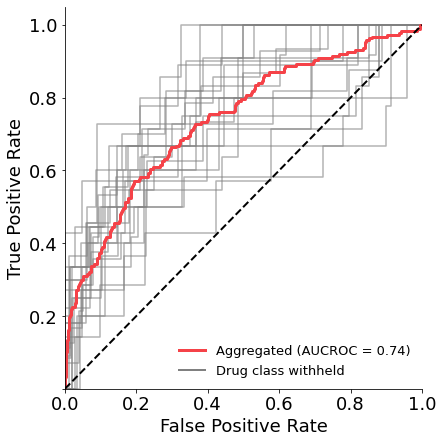

In [45]:
fig, ax = plt.subplots(figsize=(6.5,6.5))
for cl in keys:
    plt.plot(pr.fpr[cl][2], pr.tpr[cl][2],
             color='grey', lw=1.5, alpha=0.6)
plt.plot(fpr_micro, tpr_micro,
        label='Aggregated (AUCROC = {0:0.2f})'
               ''.format(roc_auc_micro),
         color='#f54248', linestyle='-', linewidth=3)

handles, labels = ax.get_legend_handles_labels()
patch = Line2D([0], [0], color='grey', linewidth=2, linestyle="-",
               label='Drug class withheld')
handles.append(patch) 
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
#ax.xaxis.get_major_ticks()[0].label1.set_visible(False)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.yaxis.get_major_ticks()[0].label1.set_visible(False)
plt.legend(handles=handles, loc='lower right', prop={"size": 13},
          frameon=False)
plt.tight_layout()
#plt.savefig('Ecoli-ROC-synergy-vs-rest-grey.pdf')

Plot average precision (AP) vs interaction rate for each cross-validation fold:

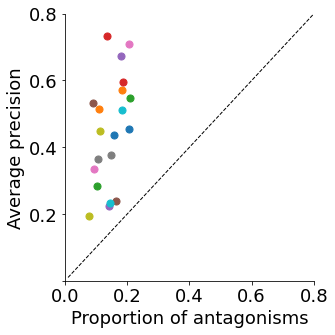

In [46]:
fig, ax = plt.subplots(figsize=(5,5))
# for antagonism predictions
for cl in keys:
    ycl = y[np.isin(combs, pr.predicted[cl]['comb'].values)].argmax(axis=1)
    antag_rate = np.sum(ycl == 1) / ycl.size
    plt.scatter(antag_rate, pr.avprec[cl][1], marker='o', 
             label=cl, s=50)
    plt.xlim((0,0.8))
    plt.ylim((0,0.8))
plt.plot([0.01, 1], [0.01, 1], 'k--', lw=1)
plt.xlabel('Proportion of antagonisms')
plt.ylabel('Average precision')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.yaxis.get_major_ticks()[0].label1.set_visible(False)
plt.tight_layout()
#plt.savefig('Ecoli-AP-antag-vs-rate.pdf')

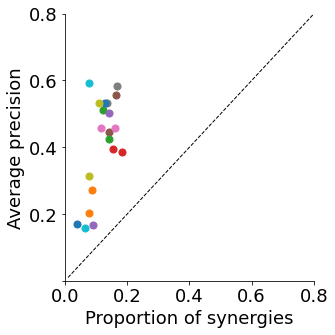

In [47]:
fig, ax = plt.subplots(figsize=(5,5))
# for antagonism predictions
for cl in keys:
    ycl = y[np.isin(combs, pr.predicted[cl]['comb'].values)].argmax(axis=1)
    syn_rate = np.sum(ycl == 2) / ycl.size
    plt.scatter(syn_rate, pr.avprec[cl][2], marker='o', 
             label=cl, s=50)
    plt.xlim((0,0.8))
    plt.ylim((0,0.8))
plt.plot([0.01, 1], [0.01, 1], 'k--', lw=1)
plt.xlabel('Proportion of synergies')
plt.ylabel('Average precision')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.yaxis.get_major_ticks()[0].label1.set_visible(False)
plt.tight_layout()
#plt.savefig('Ecoli-AP-syn-vs-rate.pdf')

<a id="calib"></a> 
## Probability calibration

In [48]:
#{'steps': 64, 'nodes': 256, 'learning_rate_deep': 0.0001, 'layers': 1, 'epochs': 600, 'dropout': 0.5, 'beta_2': 0.999, 'beta_1': 0.8}
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dropout, Dense, Activation, ZeroPadding2D, BatchNormalization, Flatten, Conv2D
def build_nn(dropout=0.5, nodes=256, layers=1, learning_rate_deep=0.0001, steps=64, beta_1=0.8, beta_2=0.999):
    model = Sequential()
    for i in range(layers):
        #With BN
        #model.add(Dense(self.nodes, activation="linear", use_bias="False"))
        #model.add(BatchNormalization())
        #model.add(Activation("relu"))
        #model.add(Dropout(self.dropout))
        #Without BN
        model.add(Dense(nodes, activation="relu"))
        model.add(Dropout(dropout))
        model.add(Dense(3, activation="softmax"))
                
        opt = keras.optimizers.Adam(learning_rate=learning_rate_deep, beta_1=beta_1, beta_2=beta_2)
        model.compile(loss = tf.keras.losses.SparseCategoricalCrossentropy(), optimizer = opt,  metrics = ["accuracy"]) #other option loss = "binary_crossentropy"
        return model

In [49]:
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import RandomForestClassifier
#clf = OneVsRestClassifier(RandomForestClassifier(bootstrap=True,
#                                                max_features='sqrt',
#                                                **param_dict,
#                                                random_state=2305,
#                                              n_jobs=-1))
clf = OneVsRestClassifier(tf.keras.wrappers.scikit_learn.KerasClassifier(build_nn, epochs=600, steps=64))

In [50]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X_onehot, y, test_size=0.2,
                                                    random_state=2305,
                                                    stratify=np.argmax(y, axis=1))

In [51]:
#clf = clf.fit(X_train, y_train)
clf= clf.fit(X_train, y_train)

Epoch 1/600
25/25 [==============================] - 0s 2ms/step - loss: 0.9154 - accuracy: 0.5969
Epoch 2/600
25/25 [==============================] - 0s 2ms/step - loss: 0.6244 - accuracy: 0.7216
Epoch 3/600
25/25 [==============================] - 0s 1ms/step - loss: 0.6249 - accuracy: 0.6804
Epoch 4/600
25/25 [==============================] - 0s 2ms/step - loss: 0.5606 - accuracy: 0.7354
Epoch 5/600
25/25 [==============================] - 0s 2ms/step - loss: 0.5350 - accuracy: 0.7506
Epoch 6/600
25/25 [==============================] - 0s 2ms/step - loss: 0.5111 - accuracy: 0.7617
Epoch 7/600
25/25 [==============================] - 0s 1ms/step - loss: 0.5176 - accuracy: 0.7621
Epoch 8/600
25/25 [==============================] - 0s 2ms/step - loss: 0.5315 - accuracy: 0.7548
Epoch 9/600
25/25 [==============================] - 0s 2ms/step - loss: 0.4823 - accuracy: 0.7843
Epoch 10/600
25/25 [==============================] - 0s 2ms/step - loss: 0.4477 - accuracy: 0.7888
Epoch 11/

In [52]:
probas_ = clf.predict(X_val)

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Plot precision-recall for the training set:

In [53]:
fpr = dict()
tpr = dict()
roc_auc = dict()
precision = dict()
recall = dict()
thresh = dict()
average_precision = dict()

In [54]:
n_classes = 3
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_val[:, i], probas_[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    precision[i], recall[i], thresh[i] = precision_recall_curve(y_val[:, i],
                                                        probas_[:, i])
    average_precision[i] = average_precision_score(y_val[:, i], probas_[:, i])


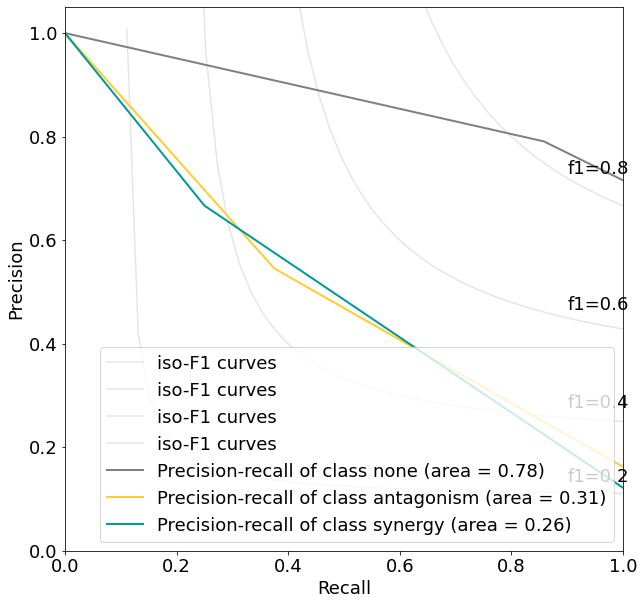

In [55]:
from itertools import cycle
class_names = ['none', 'antagonism', 'synergy']
colors = cycle(['#808080','#FFCC33', '#009999'])


plt.figure(figsize=(10,10))
f_scores = np.linspace(0.2, 0.8, num=4)

for f_score in f_scores:
    x = np.linspace(0.01, 1)
    y_ = f_score * x / (2 * x - f_score)
    plt.plot(x[y_ >= 0], y_[y_ >= 0], color='gray', alpha=0.2,
             label='iso-F1 curves')
    plt.annotate('f1={0:0.1f}'.format(f_score), xy=(0.9, y_[45] + 0.02))
for i, color in zip(range(n_classes), colors):
    plt.plot(recall[i], precision[i], color=color, lw=2,
             label='Precision-recall of class {0} (area = {1:0.2f})'
             ''.format(class_names[i], average_precision[i]))

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend(loc="lower right")

In [56]:
from sklearn.calibration import calibration_curve
fraction_of_positives = dict()
mean_predicted_value = dict()
for i in range(n_classes):
    proba_val = clf.predict_proba(X_val)[:, i]
    fraction_of_positives[i], mean_predicted_value[i] = calibration_curve(y_val[:,i],
                                                                proba_val,
                                                                n_bins=6)

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Sci

In [57]:
mean_predicted_value[2]

array([0.00499046, 0.2168835 , 0.38348329, 0.54430383, 0.74697042,
       0.95344279])

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


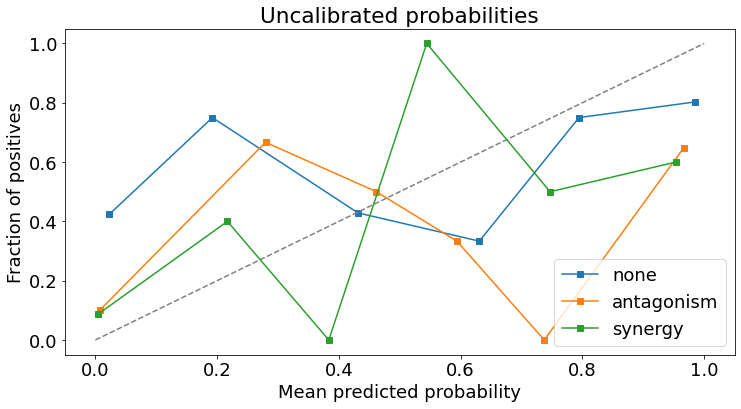

In [58]:
fig, ax = plt.subplots(1, figsize=(12, 6))
plt.plot(mean_predicted_value[0], fraction_of_positives[0], 's-', label='none')
plt.plot([0, 1], [0, 1], '--', color='gray')
plt.plot(mean_predicted_value[1], fraction_of_positives[1], 's-', label='antagonism')
plt.plot(mean_predicted_value[2], fraction_of_positives[2], 's-', label='synergy')
plt.xlabel('Mean predicted probability')
plt.ylabel('Fraction of positives')
plt.title('Uncalibrated probabilities')
plt.legend()

In [59]:
from sklearn.calibration import CalibratedClassifierCV
fraction_of_positives = dict()
mean_predicted_value = dict()
for i in range(n_classes):
    #proba_val = clf.predict_proba(X_val)[:, i]
#    clf_calib = CalibratedClassifierCV(clf.estimators_[i], cv=10, method='isotonic')
    clf_calib = CalibratedClassifierCV(clf, cv=10, method='isotonic')
    proba_val = clf_calib.fit(X_train, y_train[:,i]).predict_proba(X_val)[:,1]
    fraction_of_positives[i], mean_predicted_value[i] = calibration_curve(y_val[:,i],
                                                                proba_val,
                                                                n_bins=5)

Epoch 1/600
23/23 [==============================] - 0s 1ms/step - loss: 1.1266 - accuracy: 0.5133
Epoch 2/600
23/23 [==============================] - 0s 2ms/step - loss: 0.6050 - accuracy: 0.7308
Epoch 3/600
23/23 [==============================] - 0s 2ms/step - loss: 0.5725 - accuracy: 0.7290
Epoch 4/600
23/23 [==============================] - 0s 2ms/step - loss: 0.5718 - accuracy: 0.7357
Epoch 5/600
23/23 [==============================] - 0s 2ms/step - loss: 0.5651 - accuracy: 0.7271
Epoch 6/600
23/23 [==============================] - 0s 2ms/step - loss: 0.5145 - accuracy: 0.7543
Epoch 7/600
23/23 [==============================] - 0s 2ms/step - loss: 0.5352 - accuracy: 0.7486
Epoch 8/600
23/23 [==============================] - 0s 2ms/step - loss: 0.4937 - accuracy: 0.7567
Epoch 9/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5214 - accuracy: 0.7746
Epoch 10/600
23/23 [==============================] - 0s 2ms/step - loss: 0.4829 - accuracy: 0.7571
Epoch 11/

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


23/23 [==============================] - 0s 1ms/step - loss: 0.8924 - accuracy: 0.5573
Epoch 2/600
23/23 [==============================] - 0s 1ms/step - loss: 0.6322 - accuracy: 0.6959
Epoch 3/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5849 - accuracy: 0.7348
Epoch 4/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5259 - accuracy: 0.7787
Epoch 5/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5574 - accuracy: 0.7235
Epoch 6/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4917 - accuracy: 0.7679
Epoch 7/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5449 - accuracy: 0.7448
Epoch 8/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4843 - accuracy: 0.7812
Epoch 9/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4888 - accuracy: 0.7550
Epoch 10/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4509 - accuracy: 0.7976
Epoch 11/600
23/23 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


23/23 [==============================] - 0s 1ms/step - loss: 0.9179 - accuracy: 0.5559
Epoch 2/600
23/23 [==============================] - 0s 1ms/step - loss: 0.6614 - accuracy: 0.6813
Epoch 3/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5648 - accuracy: 0.7498
Epoch 4/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5821 - accuracy: 0.7080
Epoch 5/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4973 - accuracy: 0.7746
Epoch 6/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5322 - accuracy: 0.7587
Epoch 7/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5256 - accuracy: 0.7479
Epoch 8/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4891 - accuracy: 0.7662
Epoch 9/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5292 - accuracy: 0.7416
Epoch 10/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4421 - accuracy: 0.8085
Epoch 11/600
23/23 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


23/23 [==============================] - 0s 1ms/step - loss: 0.7977 - accuracy: 0.6476
Epoch 2/600
23/23 [==============================] - 0s 1ms/step - loss: 0.6485 - accuracy: 0.6837
Epoch 3/600
23/23 [==============================] - 0s 1ms/step - loss: 0.6154 - accuracy: 0.7244
Epoch 4/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5521 - accuracy: 0.7450
Epoch 5/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5214 - accuracy: 0.7349
Epoch 6/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5059 - accuracy: 0.7646
Epoch 7/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5296 - accuracy: 0.7661
Epoch 8/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5256 - accuracy: 0.7585
Epoch 9/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4712 - accuracy: 0.7739
Epoch 10/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4571 - accuracy: 0.7783
Epoch 11/600
23/23 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


23/23 [==============================] - 0s 1ms/step - loss: 1.0190 - accuracy: 0.5354
Epoch 2/600
23/23 [==============================] - 0s 1ms/step - loss: 0.6742 - accuracy: 0.6700
Epoch 3/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5958 - accuracy: 0.7152
Epoch 4/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5588 - accuracy: 0.7217
Epoch 5/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5806 - accuracy: 0.7122
Epoch 6/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5255 - accuracy: 0.7286
Epoch 7/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5084 - accuracy: 0.7857
Epoch 8/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4847 - accuracy: 0.7546
Epoch 9/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4691 - accuracy: 0.7937
Epoch 10/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4299 - accuracy: 0.8171
Epoch 11/600
23/23 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


23/23 [==============================] - 0s 1ms/step - loss: 0.9489 - accuracy: 0.6511
Epoch 2/600
23/23 [==============================] - 0s 1ms/step - loss: 0.7507 - accuracy: 0.6183
Epoch 3/600
23/23 [==============================] - 0s 1ms/step - loss: 0.6224 - accuracy: 0.7081
Epoch 4/600
23/23 [==============================] - 0s 1ms/step - loss: 0.6099 - accuracy: 0.7311
Epoch 5/600
23/23 [==============================] - 0s 1ms/step - loss: 0.6249 - accuracy: 0.7107
Epoch 6/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5588 - accuracy: 0.7311
Epoch 7/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5162 - accuracy: 0.7674
Epoch 8/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4950 - accuracy: 0.7747
Epoch 9/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5114 - accuracy: 0.7673
Epoch 10/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4701 - accuracy: 0.7834
Epoch 11/600
23/23 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


23/23 [==============================] - 0s 1ms/step - loss: 1.0107 - accuracy: 0.5137
Epoch 2/600
23/23 [==============================] - 0s 1ms/step - loss: 0.6362 - accuracy: 0.6813
Epoch 3/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5478 - accuracy: 0.7419
Epoch 4/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5311 - accuracy: 0.7380
Epoch 5/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5549 - accuracy: 0.7644
Epoch 6/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5506 - accuracy: 0.7416
Epoch 7/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5084 - accuracy: 0.7534
Epoch 8/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4542 - accuracy: 0.7995
Epoch 9/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4440 - accuracy: 0.7873
Epoch 10/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5203 - accuracy: 0.7472
Epoch 11/600
23/23 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


23/23 [==============================] - 0s 1ms/step - loss: 0.8741 - accuracy: 0.5978
Epoch 2/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5692 - accuracy: 0.7511
Epoch 3/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5994 - accuracy: 0.7000
Epoch 4/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5915 - accuracy: 0.7437
Epoch 5/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5334 - accuracy: 0.7305
Epoch 6/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5233 - accuracy: 0.7513
Epoch 7/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5013 - accuracy: 0.7632
Epoch 8/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5214 - accuracy: 0.7500
Epoch 9/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4606 - accuracy: 0.7848
Epoch 10/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4911 - accuracy: 0.7616
Epoch 11/600
23/23 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


23/23 [==============================] - 0s 1ms/step - loss: 0.7406 - accuracy: 0.6312
Epoch 2/600
23/23 [==============================] - 0s 1ms/step - loss: 0.6066 - accuracy: 0.7041
Epoch 3/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5317 - accuracy: 0.7452
Epoch 4/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5728 - accuracy: 0.7222
Epoch 5/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5542 - accuracy: 0.7192
Epoch 6/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4933 - accuracy: 0.7806
Epoch 7/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4934 - accuracy: 0.7645
Epoch 8/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4730 - accuracy: 0.7815
Epoch 9/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4667 - accuracy: 0.7845
Epoch 10/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4591 - accuracy: 0.7988
Epoch 11/600
23/23 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


23/23 [==============================] - 0s 1ms/step - loss: 0.8407 - accuracy: 0.6105
Epoch 2/600
23/23 [==============================] - 0s 1ms/step - loss: 0.6329 - accuracy: 0.6965
Epoch 3/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5627 - accuracy: 0.7289
Epoch 4/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5923 - accuracy: 0.7125
Epoch 5/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5299 - accuracy: 0.7547
Epoch 6/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5230 - accuracy: 0.7346
Epoch 7/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5303 - accuracy: 0.7495
Epoch 8/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4848 - accuracy: 0.7873
Epoch 9/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4655 - accuracy: 0.7768
Epoch 10/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4585 - accuracy: 0.8050
Epoch 11/600
23/23 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Sci

Epoch 1/600
23/23 [==============================] - 0s 1ms/step - loss: 1.2729 - accuracy: 0.4563
Epoch 2/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4837 - accuracy: 0.8168
Epoch 3/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3830 - accuracy: 0.8515
Epoch 4/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4389 - accuracy: 0.8397
Epoch 5/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3885 - accuracy: 0.8477
Epoch 6/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3551 - accuracy: 0.8698
Epoch 7/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3992 - accuracy: 0.8417
Epoch 8/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3331 - accuracy: 0.8595
Epoch 9/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3647 - accuracy: 0.8509
Epoch 10/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3479 - accuracy: 0.8545
Epoch 11/

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


23/23 [==============================] - 0s 1ms/step - loss: 0.7757 - accuracy: 0.6512
Epoch 2/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5176 - accuracy: 0.8183
Epoch 3/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4115 - accuracy: 0.8418
Epoch 4/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3749 - accuracy: 0.8462
Epoch 5/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3829 - accuracy: 0.8519
Epoch 6/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3487 - accuracy: 0.8461
Epoch 7/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3655 - accuracy: 0.8467
Epoch 8/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3359 - accuracy: 0.8605
Epoch 9/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3303 - accuracy: 0.8510
Epoch 10/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3451 - accuracy: 0.8630
Epoch 11/600
23/23 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Epoch 1/600
23/23 [==============================] - 0s 974us/step - loss: 0.7328 - accuracy: 0.7270
Epoch 2/600
23/23 [==============================] - 0s 889us/step - loss: 0.4879 - accuracy: 0.8125
Epoch 3/600
23/23 [==============================] - 0s 864us/step - loss: 0.4447 - accuracy: 0.8322
Epoch 4/600
23/23 [==============================] - 0s 861us/step - loss: 0.3675 - accuracy: 0.8458
Epoch 5/600
23/23 [==============================] - 0s 848us/step - loss: 0.4291 - accuracy: 0.8281
Epoch 6/600
23/23 [==============================] - 0s 846us/step - loss: 0.3643 - accuracy: 0.8280
Epoch 7/600
23/23 [==============================] - 0s 904us/step - loss: 0.3525 - accuracy: 0.8480
Epoch 8/600
23/23 [==============================] - 0s 881us/step - loss: 0.3375 - accuracy: 0.8641
Epoch 9/600
23/23 [==============================] - 3s 158ms/step - loss: 0.3326 - accuracy: 0.8550
Epoch 10/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3430 - accuracy

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


23/23 [==============================] - 0s 1ms/step - loss: 0.6163 - accuracy: 0.7737
Epoch 2/600
23/23 [==============================] - 0s 2ms/step - loss: 0.4693 - accuracy: 0.8294
Epoch 3/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4442 - accuracy: 0.8311
Epoch 4/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3995 - accuracy: 0.8508
Epoch 5/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3508 - accuracy: 0.8520
Epoch 6/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3743 - accuracy: 0.8563
Epoch 7/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3727 - accuracy: 0.8277
Epoch 8/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3289 - accuracy: 0.8582
Epoch 9/600
23/23 [==============================] - 0s 2ms/step - loss: 0.3333 - accuracy: 0.8576
Epoch 10/600
23/23 [==============================] - 0s 2ms/step - loss: 0.3421 - accuracy: 0.8645
Epoch 11/600
23/23 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


23/23 [==============================] - 0s 1ms/step - loss: 0.8100 - accuracy: 0.6457
Epoch 2/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4735 - accuracy: 0.8322
Epoch 3/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4536 - accuracy: 0.8311
Epoch 4/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3363 - accuracy: 0.8830
Epoch 5/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4064 - accuracy: 0.8224
Epoch 6/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3915 - accuracy: 0.8199
Epoch 7/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3509 - accuracy: 0.8647
Epoch 8/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3216 - accuracy: 0.8942
Epoch 9/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3413 - accuracy: 0.8713
Epoch 10/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3387 - accuracy: 0.8739
Epoch 11/600
23/23 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


23/23 [==============================] - 0s 1ms/step - loss: 0.8598 - accuracy: 0.6681
Epoch 2/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4498 - accuracy: 0.8501
Epoch 3/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4359 - accuracy: 0.8256
Epoch 4/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3957 - accuracy: 0.8431
Epoch 5/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4293 - accuracy: 0.8262
Epoch 6/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4161 - accuracy: 0.8322
Epoch 7/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3784 - accuracy: 0.8328
Epoch 8/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3532 - accuracy: 0.8502
Epoch 9/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3410 - accuracy: 0.8652
Epoch 10/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3310 - accuracy: 0.8658
Epoch 11/600
23/23 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


23/23 [==============================] - 0s 1ms/step - loss: 0.7730 - accuracy: 0.6952
Epoch 2/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5186 - accuracy: 0.7856
Epoch 3/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4271 - accuracy: 0.8377
Epoch 4/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4279 - accuracy: 0.8399
Epoch 5/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3409 - accuracy: 0.8712
Epoch 6/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3653 - accuracy: 0.8410
Epoch 7/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3409 - accuracy: 0.8607
Epoch 8/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3577 - accuracy: 0.8492
Epoch 9/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3141 - accuracy: 0.8697
Epoch 10/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3465 - accuracy: 0.8648
Epoch 11/600
23/23 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


23/23 [==============================] - 0s 1ms/step - loss: 0.7964 - accuracy: 0.6582
Epoch 2/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4392 - accuracy: 0.8417
Epoch 3/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4519 - accuracy: 0.8335
Epoch 4/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4194 - accuracy: 0.8365
Epoch 5/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3956 - accuracy: 0.8349
Epoch 6/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3671 - accuracy: 0.8591
Epoch 7/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3271 - accuracy: 0.8689
Epoch 8/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3434 - accuracy: 0.8533
Epoch 9/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3744 - accuracy: 0.8228
Epoch 10/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3182 - accuracy: 0.8717
Epoch 11/600
23/23 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


23/23 [==============================] - 0s 1ms/step - loss: 0.9249 - accuracy: 0.6000
Epoch 2/600
23/23 [==============================] - 0s 1ms/step - loss: 0.5202 - accuracy: 0.8239
Epoch 3/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4527 - accuracy: 0.8211
Epoch 4/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4023 - accuracy: 0.8452
Epoch 5/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4287 - accuracy: 0.8432
Epoch 6/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3413 - accuracy: 0.8589
Epoch 7/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3844 - accuracy: 0.8441
Epoch 8/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3324 - accuracy: 0.8696
Epoch 9/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3619 - accuracy: 0.8519
Epoch 10/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3306 - accuracy: 0.8713
Epoch 11/600
23/23 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


23/23 [==============================] - 0s 1ms/step - loss: 0.6661 - accuracy: 0.7638
Epoch 2/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4694 - accuracy: 0.8114
Epoch 3/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4268 - accuracy: 0.8308
Epoch 4/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3690 - accuracy: 0.8430
Epoch 5/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3896 - accuracy: 0.8393
Epoch 6/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3853 - accuracy: 0.8403
Epoch 7/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3599 - accuracy: 0.8534
Epoch 8/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3234 - accuracy: 0.8710
Epoch 9/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3445 - accuracy: 0.8530
Epoch 10/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3274 - accuracy: 0.8886
Epoch 11/600
23/23 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Sci

Epoch 1/600
23/23 [==============================] - 0s 1ms/step - loss: 1.3658 - accuracy: 0.4493
Epoch 2/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4925 - accuracy: 0.8592
Epoch 3/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3775 - accuracy: 0.8864
Epoch 4/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3728 - accuracy: 0.8560
Epoch 5/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3490 - accuracy: 0.8746
Epoch 6/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3406 - accuracy: 0.8734
Epoch 7/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3896 - accuracy: 0.8823
Epoch 8/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3638 - accuracy: 0.8767
Epoch 9/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3531 - accuracy: 0.8772
Epoch 10/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3124 - accuracy: 0.8886
Epoch 11/

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


23/23 [==============================] - 0s 1ms/step - loss: 0.8834 - accuracy: 0.6416
Epoch 2/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4918 - accuracy: 0.8636
Epoch 3/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4596 - accuracy: 0.8618
Epoch 4/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3925 - accuracy: 0.8644
Epoch 5/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3522 - accuracy: 0.8867
Epoch 6/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3622 - accuracy: 0.8675
Epoch 7/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3667 - accuracy: 0.8700
Epoch 8/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3005 - accuracy: 0.8911
Epoch 9/600
23/23 [==============================] - 0s 1ms/step - loss: 0.2965 - accuracy: 0.8983
Epoch 10/600
23/23 [==============================] - 0s 1ms/step - loss: 0.2955 - accuracy: 0.8928
Epoch 11/600
23/23 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


23/23 [==============================] - 0s 1ms/step - loss: 0.7087 - accuracy: 0.7233
Epoch 2/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4084 - accuracy: 0.8746
Epoch 3/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4041 - accuracy: 0.8711
Epoch 4/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3878 - accuracy: 0.8836
Epoch 5/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3576 - accuracy: 0.8616
Epoch 6/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3136 - accuracy: 0.8992
Epoch 7/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3404 - accuracy: 0.8773
Epoch 8/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3031 - accuracy: 0.8920
Epoch 9/600
23/23 [==============================] - 0s 2ms/step - loss: 0.3107 - accuracy: 0.8928
Epoch 10/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3034 - accuracy: 0.8872
Epoch 11/600
23/23 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


23/23 [==============================] - 0s 1ms/step - loss: 0.6027 - accuracy: 0.8015
Epoch 2/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4308 - accuracy: 0.8528
Epoch 3/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3456 - accuracy: 0.8878
Epoch 4/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3593 - accuracy: 0.8623
Epoch 5/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3768 - accuracy: 0.8744
Epoch 6/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3534 - accuracy: 0.8716
Epoch 7/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3400 - accuracy: 0.8659
Epoch 8/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3433 - accuracy: 0.8618
Epoch 9/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3137 - accuracy: 0.8938
Epoch 10/600
23/23 [==============================] - 0s 1ms/step - loss: 0.2923 - accuracy: 0.8802
Epoch 11/600
23/23 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


23/23 [==============================] - 0s 1ms/step - loss: 0.7277 - accuracy: 0.7146
Epoch 2/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4055 - accuracy: 0.8832
Epoch 3/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4263 - accuracy: 0.8688
Epoch 4/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3724 - accuracy: 0.8766
Epoch 5/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3462 - accuracy: 0.8701
Epoch 6/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3212 - accuracy: 0.8914
Epoch 7/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3398 - accuracy: 0.8738
Epoch 8/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3229 - accuracy: 0.8861
Epoch 9/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3510 - accuracy: 0.8815
Epoch 10/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3187 - accuracy: 0.8770
Epoch 11/600
23/23 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


23/23 [==============================] - 0s 1ms/step - loss: 0.9117 - accuracy: 0.6053
Epoch 2/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4444 - accuracy: 0.8665
Epoch 3/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4123 - accuracy: 0.8771
Epoch 4/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3977 - accuracy: 0.8662
Epoch 5/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3857 - accuracy: 0.8642
Epoch 6/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3252 - accuracy: 0.8854
Epoch 7/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3220 - accuracy: 0.8918
Epoch 8/600
23/23 [==============================] - 0s 1ms/step - loss: 0.2881 - accuracy: 0.8926
Epoch 9/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3045 - accuracy: 0.8861
Epoch 10/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3462 - accuracy: 0.8587
Epoch 11/600
23/23 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Epoch 1/600
23/23 [==============================] - 0s 1ms/step - loss: 0.7569 - accuracy: 0.7054
Epoch 2/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4537 - accuracy: 0.8748
Epoch 3/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4721 - accuracy: 0.8571
Epoch 4/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4113 - accuracy: 0.8708
Epoch 5/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3706 - accuracy: 0.8695
Epoch 6/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3848 - accuracy: 0.8633
Epoch 7/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3250 - accuracy: 0.8778
Epoch 8/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3331 - accuracy: 0.8939
Epoch 9/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3071 - accuracy: 0.8819
Epoch 10/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3127 - accuracy: 0.8774
Epoch 11/

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


23/23 [==============================] - 0s 1ms/step - loss: 0.7661 - accuracy: 0.6759
Epoch 2/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4195 - accuracy: 0.8693
Epoch 3/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3297 - accuracy: 0.9071
Epoch 4/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3705 - accuracy: 0.8810
Epoch 5/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3684 - accuracy: 0.8728
Epoch 6/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4083 - accuracy: 0.8514
Epoch 7/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3284 - accuracy: 0.8904
Epoch 8/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3330 - accuracy: 0.8812
Epoch 9/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3178 - accuracy: 0.8778
Epoch 10/600
23/23 [==============================] - 0s 1ms/step - loss: 0.2916 - accuracy: 0.8887
Epoch 11/600
23/23 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


23/23 [==============================] - 0s 1ms/step - loss: 0.7582 - accuracy: 0.7243
Epoch 2/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4237 - accuracy: 0.8779
Epoch 3/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4108 - accuracy: 0.8573
Epoch 4/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3395 - accuracy: 0.8989
Epoch 5/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3502 - accuracy: 0.8832
Epoch 6/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3162 - accuracy: 0.8959
Epoch 7/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3292 - accuracy: 0.8890
Epoch 8/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3087 - accuracy: 0.8887
Epoch 9/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3390 - accuracy: 0.8696
Epoch 10/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3054 - accuracy: 0.8842
Epoch 11/600
23/23 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


23/23 [==============================] - 0s 1ms/step - loss: 0.7163 - accuracy: 0.6949
Epoch 2/600
23/23 [==============================] - 0s 1ms/step - loss: 0.4545 - accuracy: 0.8646
Epoch 3/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3613 - accuracy: 0.8876
Epoch 4/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3702 - accuracy: 0.8856
Epoch 5/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3304 - accuracy: 0.8854
Epoch 6/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3127 - accuracy: 0.9010
Epoch 7/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3349 - accuracy: 0.8760
Epoch 8/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3403 - accuracy: 0.8758
Epoch 9/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3515 - accuracy: 0.8783
Epoch 10/600
23/23 [==============================] - 0s 1ms/step - loss: 0.3234 - accuracy: 0.8715
Epoch 11/600
23/23 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Sci

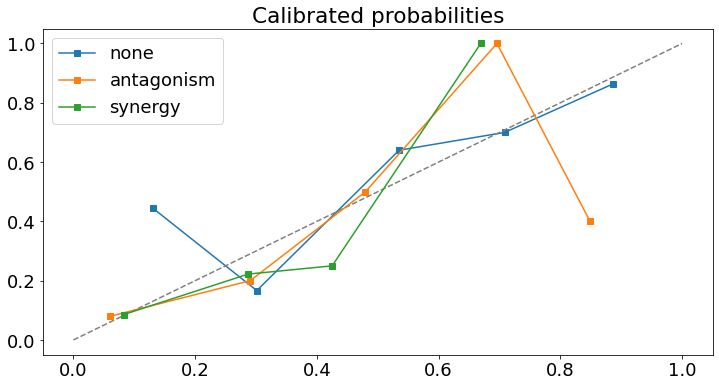

In [60]:
fig, ax = plt.subplots(1, figsize=(12, 6))
plt.plot(mean_predicted_value[0], fraction_of_positives[0], 's-', label='none')
plt.plot([0, 1], [0, 1], '--', color='gray')
plt.plot(mean_predicted_value[1], fraction_of_positives[1], 's-', label='antagonism')
plt.plot(mean_predicted_value[2], fraction_of_positives[2], 's-', label='synergy')
plt.title('Calibrated probabilities')
plt.legend()

Somehow probability calibration doesn't work for synergy prediction

<a id="test"></a> 
## Generate Predictions on the Test Set

In [61]:
X_drugs = pd.read_csv('../data/chemgenetics/nichols_testset_signed.csv', index_col=0)

In [62]:
X_drugs = X_drugs.iloc[:,np.where(np.isin(X_drugs.columns, gene_subset))[0]]

In [63]:
X_drugs.shape

(45, 350)

In [64]:
test_drugs = X_drugs.index.values

In [65]:
combs_test = list(itertools.combinations(test_drugs, 2))
combs_test = np.array([i[0]+"_"+i[1] for i in combs_test])

In [66]:
len(combs_test)

990

In [67]:
X_test = pd.DataFrame([utl.get_comb_feat_signed(X_drugs, c) for c in combs_test])

In [68]:
X_test = pd.get_dummies(X_test.astype('category'))

In [69]:
X_test.iloc[:10,:12]

,ACRA_-2,ACRA_-1,ACRA_0,ACRA_1,ACRA_2,ACRA_3,ACRB_-2,ACRB_-1,ACRB_0,ACRB_1,ACRB_2,ACRB_3
0,0,1,0,0,0,0,0,1,0,0,0,0
1,1,0,0,0,0,0,1,0,0,0,0,0
2,0,1,0,0,0,0,1,0,0,0,0,0
3,0,1,0,0,0,0,0,1,0,0,0,0
4,1,0,0,0,0,0,1,0,0,0,0,0
5,0,1,0,0,0,0,0,1,0,0,0,0
6,1,0,0,0,0,0,0,1,0,0,0,0
7,0,1,0,0,0,0,0,1,0,0,0,0
8,0,1,0,0,0,0,0,1,0,0,0,0
9,0,1,0,0,0,0,0,1,0,0,0,0


Pad some columns (as some are all zeros in the test set):

In [70]:
X_test.shape

(990, 1179)

In [71]:
cols_pad = np.setdiff1d(X_onehot.columns, X_test.columns)

In [72]:
for col in cols_pad:
    X_test[col] = 0

In [73]:
X_test = X_test.loc[:,np.isin(X_test.columns, X_onehot.columns)]

In [74]:
X_test = X_test[X_onehot.columns]

In [75]:
np.all(X_test.columns == X_onehot.columns)

True

In [76]:
# without probability calibration
y_test_proba = clf.fit(X_onehot, y).predict_proba(X_test)
antag = combs_test[y_test_proba[:,1] > antag_thresh]
syn = combs_test[y_test_proba[:,2] > syn_thresh]

Epoch 1/600
31/31 [==============================] - 0s 1ms/step - loss: 0.8820 - accuracy: 0.6023
Epoch 2/600
31/31 [==============================] - 0s 2ms/step - loss: 0.5927 - accuracy: 0.7227
Epoch 3/600
31/31 [==============================] - 0s 2ms/step - loss: 0.6146 - accuracy: 0.6944
Epoch 4/600
31/31 [==============================] - 0s 2ms/step - loss: 0.5750 - accuracy: 0.7181
Epoch 5/600
31/31 [==============================] - 0s 1ms/step - loss: 0.5221 - accuracy: 0.7594
Epoch 6/600
31/31 [==============================] - 0s 1ms/step - loss: 0.5382 - accuracy: 0.7175
Epoch 7/600
31/31 [==============================] - 0s 2ms/step - loss: 0.5147 - accuracy: 0.7588
Epoch 8/600
31/31 [==============================] - 0s 1ms/step - loss: 0.5036 - accuracy: 0.7710
Epoch 9/600
31/31 [==============================] - 0s 2ms/step - loss: 0.4551 - accuracy: 0.7909
Epoch 10/600
31/31 [==============================] - 0s 2ms/step - loss: 0.4904 - accuracy: 0.7609
Epoch 11/

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


In [77]:
np.setdiff1d(antag, syn)

array(['Actinomycin D_Carbenicillin', 'Bicyclomycin_Sds',
       'Carbenicillin_Cholate', 'Cecropinb_Sds', 'Ceftazidime_Sds',
       'Chlorpromazine_Sds', 'Chlorpromazine_Tetracycline',
       'Deoxycholate_Sds', 'Nigericin_Sds', 'Norfloxacin_Sds', 'Pms_Sds',
       'Sds_Sulfamethizole', 'Sds_Tetracycline'], dtype='<U31')

In [78]:
np.setdiff1d(syn, antag)

array([], dtype='<U31')

In [79]:
np.intersect1d(antag, syn)

array([], dtype='<U31')

In [80]:
prob_uncalibr = pd.DataFrame(y_test_proba, index=combs_test,
             columns=['none', 'antag', 'synergy'])

In [81]:
prob_uncalibr.to_csv('nichols_test_pred.csv')

In [82]:
prob_uncalibr.sort_values('antag', ascending=False).iloc[:20,:]

,none,antag,synergy
Carbenicillin_Cholate,1.008854e-02,0.997387,1.086666e-09
Bicyclomycin_Sds,8.424101e-05,0.995408,2.769570e-02
Ceftazidime_Sds,8.248881e-04,0.981557,3.155914e-06
Norfloxacin_Sds,1.707374e-04,0.977978,6.814260e-04
Deoxycholate_Sds,8.465502e-08,0.874916,1.356025e-04
Sds_Tetracycline,4.104568e-02,0.822490,1.472293e-07
Actinomycin D_Carbenicillin,3.999454e-01,0.797041,2.060691e-08
Sds_Sulfamethizole,4.567143e-04,0.727035,2.171030e-01
Nigericin_Sds,2.975553e-02,0.706366,1.622408e-04
Cecropinb_Sds,3.421733e-01,0.701142,4.844256e-05


In [83]:
prob_uncalibr.sort_values('synergy', ascending=False).iloc[:20,:]

,none,antag,synergy
Taurocholate_Vancomycin,0.002910,7.687159e-04,0.910793
Cefoxitin_Ceftazidime,0.012795,3.484454e-09,0.611905
Nalidixicacid_Streptonigrin,0.959138,1.715991e-12,0.522729
Ampicillin_Cefoxitin,0.369650,3.442244e-12,0.464245
Radicicol_Taurocholate,0.685887,6.948088e-06,0.408439
Actinomycin D_Ethanol,0.554957,1.269834e-07,0.401655
Azidothymidine_Sds,0.015176,1.675447e-06,0.369837
Cefoxitin_Vancomycin,0.352248,1.461946e-06,0.363991
Ethanol_Nalidixicacid,0.011597,1.355097e-04,0.338727
Actinomycin D_Taurocholate,0.005106,3.080855e-01,0.221225


In [84]:
from sklearn.model_selection import StratifiedKFold
skf = StratifiedKFold(n_splits=10)

# with calibration (using stratified KFold for calibrator)
probs = dict()
for i in range(n_classes):
#    clf_calib = CalibratedClassifierCV(clf.estimators_[i], cv=skf, method='isotonic')
    clf_calib = CalibratedClassifierCV(clf, cv=skf, method='isotonic')
    probs[i] = clf_calib.fit(X_onehot, y[:,i]).predict_proba(X_test)

Epoch 1/600
28/28 [==============================] - 1s 1ms/step - loss: 0.8659 - accuracy: 0.6192
Epoch 2/600
28/28 [==============================] - 0s 1ms/step - loss: 0.6445 - accuracy: 0.6684
Epoch 3/600
28/28 [==============================] - 0s 2ms/step - loss: 0.5930 - accuracy: 0.7150
Epoch 4/600
28/28 [==============================] - 0s 2ms/step - loss: 0.5781 - accuracy: 0.7011
Epoch 5/600
28/28 [==============================] - 0s 2ms/step - loss: 0.5195 - accuracy: 0.7500
Epoch 6/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5287 - accuracy: 0.7377
Epoch 7/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5385 - accuracy: 0.7438
Epoch 8/600
28/28 [==============================] - 0s 2ms/step - loss: 0.4865 - accuracy: 0.7556
Epoch 9/600
28/28 [==============================] - 0s 2ms/step - loss: 0.4756 - accuracy: 0.7709
Epoch 10/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4865 - accuracy: 0.7650
Epoch 11/

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


28/28 [==============================] - 0s 1ms/step - loss: 0.8520 - accuracy: 0.6072
Epoch 2/600
28/28 [==============================] - 0s 1ms/step - loss: 0.6374 - accuracy: 0.6861
Epoch 3/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5813 - accuracy: 0.7427
Epoch 4/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5982 - accuracy: 0.7297
Epoch 5/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5521 - accuracy: 0.7227
Epoch 6/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5179 - accuracy: 0.7506
Epoch 7/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5076 - accuracy: 0.7805
Epoch 8/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4901 - accuracy: 0.7637
Epoch 9/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4921 - accuracy: 0.7534
Epoch 10/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4686 - accuracy: 0.7918
Epoch 11/600
28/28 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


28/28 [==============================] - 0s 1ms/step - loss: 0.8934 - accuracy: 0.5899
Epoch 2/600
28/28 [==============================] - 0s 1ms/step - loss: 0.6422 - accuracy: 0.7045
Epoch 3/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5792 - accuracy: 0.7069
Epoch 4/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5578 - accuracy: 0.7356
Epoch 5/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5208 - accuracy: 0.7575
Epoch 6/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5448 - accuracy: 0.7255
Epoch 7/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4956 - accuracy: 0.7566
Epoch 8/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4757 - accuracy: 0.7699
Epoch 9/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4880 - accuracy: 0.7641
Epoch 10/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4922 - accuracy: 0.7636
Epoch 11/600
28/28 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


28/28 [==============================] - 0s 1ms/step - loss: 0.8624 - accuracy: 0.5945
Epoch 2/600
28/28 [==============================] - 0s 1ms/step - loss: 0.6245 - accuracy: 0.6964
Epoch 3/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5597 - accuracy: 0.7324
Epoch 4/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5959 - accuracy: 0.6883
Epoch 5/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5454 - accuracy: 0.7421
Epoch 6/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5012 - accuracy: 0.7830
Epoch 7/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5217 - accuracy: 0.7602
Epoch 8/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4733 - accuracy: 0.7917
Epoch 9/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4937 - accuracy: 0.7619
Epoch 10/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4570 - accuracy: 0.8001
Epoch 11/600
28/28 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


28/28 [==============================] - 0s 1ms/step - loss: 1.1363 - accuracy: 0.4422
Epoch 2/600
28/28 [==============================] - 0s 1ms/step - loss: 0.6190 - accuracy: 0.7031
Epoch 3/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5760 - accuracy: 0.7189
Epoch 4/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5628 - accuracy: 0.7376
Epoch 5/600
28/28 [==============================] - 0s 964us/step - loss: 0.5420 - accuracy: 0.7294
Epoch 6/600
28/28 [==============================] - 0s 948us/step - loss: 0.5251 - accuracy: 0.7395
Epoch 7/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5149 - accuracy: 0.7554
Epoch 8/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5047 - accuracy: 0.7406
Epoch 9/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4624 - accuracy: 0.7893
Epoch 10/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4943 - accuracy: 0.7747
Epoch 11/600
28/2

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


28/28 [==============================] - 0s 1ms/step - loss: 0.9145 - accuracy: 0.5790
Epoch 2/600
28/28 [==============================] - 0s 1ms/step - loss: 0.6811 - accuracy: 0.6664
Epoch 3/600
28/28 [==============================] - 0s 1ms/step - loss: 0.6136 - accuracy: 0.7010
Epoch 4/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5877 - accuracy: 0.7081
Epoch 5/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5200 - accuracy: 0.7619
Epoch 6/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5088 - accuracy: 0.7572
Epoch 7/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5225 - accuracy: 0.7399
Epoch 8/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5133 - accuracy: 0.7531
Epoch 9/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4656 - accuracy: 0.7765
Epoch 10/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4772 - accuracy: 0.7823
Epoch 11/600
28/28 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


28/28 [==============================] - 0s 1ms/step - loss: 1.0406 - accuracy: 0.4709
Epoch 2/600
28/28 [==============================] - 0s 1ms/step - loss: 0.6620 - accuracy: 0.6824
Epoch 3/600
28/28 [==============================] - 0s 1ms/step - loss: 0.6108 - accuracy: 0.6859
Epoch 4/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5550 - accuracy: 0.7257
Epoch 5/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5227 - accuracy: 0.7467
Epoch 6/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5134 - accuracy: 0.7431
Epoch 7/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5303 - accuracy: 0.7581
Epoch 8/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5315 - accuracy: 0.7563
Epoch 9/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4825 - accuracy: 0.7678
Epoch 10/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4825 - accuracy: 0.7642
Epoch 11/600
28/28 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


28/28 [==============================] - 0s 1ms/step - loss: 0.8386 - accuracy: 0.6490
Epoch 2/600
28/28 [==============================] - 0s 1ms/step - loss: 0.6448 - accuracy: 0.7083
Epoch 3/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5961 - accuracy: 0.7134
Epoch 4/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5287 - accuracy: 0.7502
Epoch 5/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5564 - accuracy: 0.7277
Epoch 6/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4878 - accuracy: 0.7662
Epoch 7/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4640 - accuracy: 0.7795
Epoch 8/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4713 - accuracy: 0.7664
Epoch 9/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4431 - accuracy: 0.8094
Epoch 10/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4607 - accuracy: 0.7783
Epoch 11/600
28/28 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


28/28 [==============================] - 0s 1ms/step - loss: 0.9201 - accuracy: 0.6229
Epoch 2/600
28/28 [==============================] - 0s 1ms/step - loss: 0.6214 - accuracy: 0.7138
Epoch 3/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5925 - accuracy: 0.7119
Epoch 4/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5262 - accuracy: 0.7326
Epoch 5/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5489 - accuracy: 0.7259
Epoch 6/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4900 - accuracy: 0.7825
Epoch 7/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4899 - accuracy: 0.7644
Epoch 8/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5122 - accuracy: 0.7507
Epoch 9/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4365 - accuracy: 0.8118
Epoch 10/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4740 - accuracy: 0.7684
Epoch 11/600
28/28 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


28/28 [==============================] - 0s 1ms/step - loss: 0.7264 - accuracy: 0.6460
Epoch 2/600
28/28 [==============================] - 0s 1ms/step - loss: 0.6056 - accuracy: 0.7147
Epoch 3/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5534 - accuracy: 0.7369
Epoch 4/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5294 - accuracy: 0.7628
Epoch 5/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5151 - accuracy: 0.7649
Epoch 6/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4925 - accuracy: 0.7644
Epoch 7/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5107 - accuracy: 0.7490
Epoch 8/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4715 - accuracy: 0.7743
Epoch 9/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4696 - accuracy: 0.7801
Epoch 10/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4442 - accuracy: 0.7791
Epoch 11/600
28/28 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Sci

Epoch 1/600
28/28 [==============================] - 0s 1ms/step - loss: 0.7155 - accuracy: 0.7264
Epoch 2/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4412 - accuracy: 0.8373
Epoch 3/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3980 - accuracy: 0.8450
Epoch 4/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3839 - accuracy: 0.8603
Epoch 5/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3471 - accuracy: 0.8660
Epoch 6/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3932 - accuracy: 0.8194
Epoch 7/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3266 - accuracy: 0.8555
Epoch 8/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3591 - accuracy: 0.8211
Epoch 9/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3253 - accuracy: 0.8585
Epoch 10/600
28/28 [==============================] - 0s 1ms/step - loss: 0.2951 - accuracy: 0.8875
Epoch 11/

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


28/28 [==============================] - 0s 1ms/step - loss: 0.7539 - accuracy: 0.6888
Epoch 2/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4503 - accuracy: 0.8268
Epoch 3/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4743 - accuracy: 0.8239
Epoch 4/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4140 - accuracy: 0.8431
Epoch 5/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3964 - accuracy: 0.8351
Epoch 6/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4184 - accuracy: 0.8152
Epoch 7/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3582 - accuracy: 0.8411
Epoch 8/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3219 - accuracy: 0.8638
Epoch 9/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3310 - accuracy: 0.8655
Epoch 10/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3351 - accuracy: 0.8729
Epoch 11/600
28/28 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


28/28 [==============================] - 0s 1ms/step - loss: 0.6751 - accuracy: 0.7571
Epoch 2/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4944 - accuracy: 0.8034
Epoch 3/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4244 - accuracy: 0.8313
Epoch 4/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3753 - accuracy: 0.8460
Epoch 5/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3830 - accuracy: 0.8420
Epoch 6/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3659 - accuracy: 0.8566
Epoch 7/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3462 - accuracy: 0.8545
Epoch 8/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3436 - accuracy: 0.8407
Epoch 9/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3190 - accuracy: 0.8730
Epoch 10/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3343 - accuracy: 0.8512
Epoch 11/600
28/28 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


Epoch 1/600
28/28 [==============================] - 0s 1ms/step - loss: 0.7990 - accuracy: 0.6519
Epoch 2/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4650 - accuracy: 0.8168
Epoch 3/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4368 - accuracy: 0.8374
Epoch 4/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3934 - accuracy: 0.8533
Epoch 5/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3624 - accuracy: 0.8579
Epoch 6/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3275 - accuracy: 0.8637
Epoch 7/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3060 - accuracy: 0.8923
Epoch 8/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3544 - accuracy: 0.8659
Epoch 9/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3559 - accuracy: 0.8469
Epoch 10/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3160 - accuracy: 0.8623
Epoch 11/

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


28/28 [==============================] - 0s 1ms/step - loss: 1.0991 - accuracy: 0.5318
Epoch 2/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4804 - accuracy: 0.8260
Epoch 3/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4826 - accuracy: 0.8190
Epoch 4/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3987 - accuracy: 0.8542
Epoch 5/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3776 - accuracy: 0.8379
Epoch 6/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3902 - accuracy: 0.8361
Epoch 7/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3251 - accuracy: 0.8670
Epoch 8/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3446 - accuracy: 0.8575
Epoch 9/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3552 - accuracy: 0.8618
Epoch 10/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3225 - accuracy: 0.8603
Epoch 11/600
28/28 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


28/28 [==============================] - 0s 1ms/step - loss: 1.0038 - accuracy: 0.5490
Epoch 2/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4982 - accuracy: 0.7908
Epoch 3/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4531 - accuracy: 0.8257
Epoch 4/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4194 - accuracy: 0.8407
Epoch 5/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3769 - accuracy: 0.8508
Epoch 6/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3763 - accuracy: 0.8460
Epoch 7/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3699 - accuracy: 0.8362
Epoch 8/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3348 - accuracy: 0.8718
Epoch 9/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3521 - accuracy: 0.8476
Epoch 10/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3413 - accuracy: 0.8641
Epoch 11/600
28/28 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


28/28 [==============================] - 0s 1ms/step - loss: 0.7869 - accuracy: 0.6580
Epoch 2/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4991 - accuracy: 0.8215
Epoch 3/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4113 - accuracy: 0.8417
Epoch 4/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3516 - accuracy: 0.8455
Epoch 5/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3534 - accuracy: 0.8542
Epoch 6/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3541 - accuracy: 0.8522
Epoch 7/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3658 - accuracy: 0.8427
Epoch 8/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3457 - accuracy: 0.8483
Epoch 9/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3114 - accuracy: 0.8682
Epoch 10/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3320 - accuracy: 0.8498
Epoch 11/600
28/28 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


28/28 [==============================] - 0s 1ms/step - loss: 1.1849 - accuracy: 0.4902
Epoch 2/600
28/28 [==============================] - 0s 1ms/step - loss: 0.5508 - accuracy: 0.7951
Epoch 3/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4210 - accuracy: 0.8476
Epoch 4/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3980 - accuracy: 0.8330
Epoch 5/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3740 - accuracy: 0.8410
Epoch 6/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3982 - accuracy: 0.8226
Epoch 7/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3321 - accuracy: 0.8620
Epoch 8/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3466 - accuracy: 0.8667
Epoch 9/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3382 - accuracy: 0.8673
Epoch 10/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3240 - accuracy: 0.8657
Epoch 11/600
28/28 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


28/28 [==============================] - 0s 1ms/step - loss: 0.5930 - accuracy: 0.8014
Epoch 2/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4492 - accuracy: 0.8182
Epoch 3/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4068 - accuracy: 0.8438
Epoch 4/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3853 - accuracy: 0.8434
Epoch 5/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3395 - accuracy: 0.8624
Epoch 6/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3551 - accuracy: 0.8412
Epoch 7/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3364 - accuracy: 0.8588
Epoch 8/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3029 - accuracy: 0.8622
Epoch 9/600
28/28 [==============================] - 0s 1ms/step - loss: 0.2929 - accuracy: 0.8667
Epoch 10/600
28/28 [==============================] - 0s 1ms/step - loss: 0.2935 - accuracy: 0.8692
Epoch 11/600
28/28 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


28/28 [==============================] - 0s 1ms/step - loss: 0.7848 - accuracy: 0.6554
Epoch 2/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4193 - accuracy: 0.8403
Epoch 3/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4123 - accuracy: 0.8462
Epoch 4/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4205 - accuracy: 0.8393
Epoch 5/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3576 - accuracy: 0.8655
Epoch 6/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3875 - accuracy: 0.8348
Epoch 7/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3861 - accuracy: 0.8326
Epoch 8/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3383 - accuracy: 0.8688
Epoch 9/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3366 - accuracy: 0.8556
Epoch 10/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3219 - accuracy: 0.8654
Epoch 11/600
28/28 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Sci

Epoch 1/600
28/28 [==============================] - 0s 1ms/step - loss: 0.6579 - accuracy: 0.7372
Epoch 2/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4334 - accuracy: 0.8697
Epoch 3/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4177 - accuracy: 0.8689
Epoch 4/600
28/28 [==============================] - 0s 2ms/step - loss: 0.3436 - accuracy: 0.8789
Epoch 5/600
28/28 [==============================] - 0s 2ms/step - loss: 0.3189 - accuracy: 0.8912
Epoch 6/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3106 - accuracy: 0.8905
Epoch 7/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3279 - accuracy: 0.8799
Epoch 8/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3113 - accuracy: 0.8899
Epoch 9/600
28/28 [==============================] - 0s 1ms/step - loss: 0.2892 - accuracy: 0.8894
Epoch 10/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3221 - accuracy: 0.8823
Epoch 11/

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


28/28 [==============================] - 0s 1ms/step - loss: 0.6945 - accuracy: 0.7174
Epoch 2/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4109 - accuracy: 0.8744
Epoch 3/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3525 - accuracy: 0.8845
Epoch 4/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3799 - accuracy: 0.8777
Epoch 5/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3555 - accuracy: 0.8783
Epoch 6/600
28/28 [==============================] - 0s 1ms/step - loss: 0.2923 - accuracy: 0.8891
Epoch 7/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3019 - accuracy: 0.8973
Epoch 8/600
28/28 [==============================] - 0s 1ms/step - loss: 0.2585 - accuracy: 0.9143
Epoch 9/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3260 - accuracy: 0.8847
Epoch 10/600
28/28 [==============================] - 0s 1ms/step - loss: 0.2843 - accuracy: 0.8924
Epoch 11/600
28/28 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


28/28 [==============================] - 0s 1ms/step - loss: 0.5358 - accuracy: 0.8201
Epoch 2/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3758 - accuracy: 0.8730
Epoch 3/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3498 - accuracy: 0.8897
Epoch 4/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3469 - accuracy: 0.8788
Epoch 5/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3336 - accuracy: 0.8786
Epoch 6/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3486 - accuracy: 0.8768
Epoch 7/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3406 - accuracy: 0.8838
Epoch 8/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3076 - accuracy: 0.8967
Epoch 9/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3083 - accuracy: 0.8888
Epoch 10/600
28/28 [==============================] - 0s 1ms/step - loss: 0.2603 - accuracy: 0.9104
Epoch 11/600
28/28 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


28/28 [==============================] - 0s 1ms/step - loss: 0.8399 - accuracy: 0.6549
Epoch 2/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4275 - accuracy: 0.8587
Epoch 3/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3965 - accuracy: 0.8780
Epoch 4/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3181 - accuracy: 0.8817
Epoch 5/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3786 - accuracy: 0.8620
Epoch 6/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3407 - accuracy: 0.8687
Epoch 7/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3423 - accuracy: 0.8670
Epoch 8/600
28/28 [==============================] - 0s 1ms/step - loss: 0.2932 - accuracy: 0.9014
Epoch 9/600
28/28 [==============================] - 0s 1ms/step - loss: 0.2743 - accuracy: 0.9006
Epoch 10/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3099 - accuracy: 0.8873
Epoch 11/600
28/28 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


28/28 [==============================] - 0s 1ms/step - loss: 0.8818 - accuracy: 0.5610
Epoch 2/600
28/28 [==============================] - 0s 935us/step - loss: 0.4075 - accuracy: 0.8567
Epoch 3/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3800 - accuracy: 0.8744
Epoch 4/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3836 - accuracy: 0.8656
Epoch 5/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3728 - accuracy: 0.8750
Epoch 6/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3317 - accuracy: 0.8905
Epoch 7/600
28/28 [==============================] - 0s 1ms/step - loss: 0.2883 - accuracy: 0.8883
Epoch 8/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3671 - accuracy: 0.8695
Epoch 9/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3414 - accuracy: 0.8777
Epoch 10/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3084 - accuracy: 0.8896
Epoch 11/600
28/28 

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


28/28 [==============================] - 0s 1ms/step - loss: 0.7841 - accuracy: 0.6893
Epoch 2/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4805 - accuracy: 0.8435
Epoch 3/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3918 - accuracy: 0.8738
Epoch 4/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3388 - accuracy: 0.8888
Epoch 5/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3380 - accuracy: 0.8890
Epoch 6/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3563 - accuracy: 0.8607
Epoch 7/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3090 - accuracy: 0.8907
Epoch 8/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3232 - accuracy: 0.8819
Epoch 9/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3333 - accuracy: 0.8769
Epoch 10/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3142 - accuracy: 0.8799
Epoch 11/600
28/28 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


28/28 [==============================] - 1s 1ms/step - loss: 0.6191 - accuracy: 0.7609
Epoch 2/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4191 - accuracy: 0.8572
Epoch 3/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3645 - accuracy: 0.8762
Epoch 4/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3785 - accuracy: 0.8693
Epoch 5/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3442 - accuracy: 0.8817
Epoch 6/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3159 - accuracy: 0.8980
Epoch 7/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3184 - accuracy: 0.8927
Epoch 8/600
28/28 [==============================] - 0s 1ms/step - loss: 0.2980 - accuracy: 0.8866
Epoch 9/600
28/28 [==============================] - 0s 1ms/step - loss: 0.2876 - accuracy: 0.8889
Epoch 10/600
28/28 [==============================] - 0s 1ms/step - loss: 0.2703 - accuracy: 0.9020
Epoch 11/600
28/28 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


28/28 [==============================] - 0s 1ms/step - loss: 0.7457 - accuracy: 0.6572
Epoch 2/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4449 - accuracy: 0.8653
Epoch 3/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3658 - accuracy: 0.8811
Epoch 4/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4003 - accuracy: 0.8637
Epoch 5/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3511 - accuracy: 0.8650
Epoch 6/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3472 - accuracy: 0.8764
Epoch 7/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3377 - accuracy: 0.8740
Epoch 8/600
28/28 [==============================] - 0s 1ms/step - loss: 0.2866 - accuracy: 0.9022
Epoch 9/600
28/28 [==============================] - 0s 1ms/step - loss: 0.2895 - accuracy: 0.8971
Epoch 10/600
28/28 [==============================] - 0s 1ms/step - loss: 0.2629 - accuracy: 0.9166
Epoch 11/600
28/28 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


28/28 [==============================] - 0s 1ms/step - loss: 0.7623 - accuracy: 0.7062
Epoch 2/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4057 - accuracy: 0.8645
Epoch 3/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3667 - accuracy: 0.8787
Epoch 4/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3968 - accuracy: 0.8552
Epoch 5/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3262 - accuracy: 0.8820
Epoch 6/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3508 - accuracy: 0.8636
Epoch 7/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3071 - accuracy: 0.8915
Epoch 8/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3185 - accuracy: 0.8855
Epoch 9/600
28/28 [==============================] - 0s 1ms/step - loss: 0.2853 - accuracy: 0.8856
Epoch 10/600
28/28 [==============================] - 0s 1ms/step - loss: 0.2699 - accuracy: 0.8988
Epoch 11/600
28/28 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


28/28 [==============================] - 0s 1ms/step - loss: 0.8046 - accuracy: 0.6575
Epoch 2/600
28/28 [==============================] - 0s 1ms/step - loss: 0.4148 - accuracy: 0.8619
Epoch 3/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3798 - accuracy: 0.8647
Epoch 4/600
28/28 [==============================] - 0s 2ms/step - loss: 0.3708 - accuracy: 0.8696
Epoch 5/600
28/28 [==============================] - 0s 2ms/step - loss: 0.3559 - accuracy: 0.8675
Epoch 6/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3155 - accuracy: 0.8789
Epoch 7/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3283 - accuracy: 0.8648
Epoch 8/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3176 - accuracy: 0.8859
Epoch 9/600
28/28 [==============================] - 0s 1ms/step - loss: 0.2826 - accuracy: 0.8911
Epoch 10/600
28/28 [==============================] - 0s 1ms/step - loss: 0.3128 - accuracy: 0.8767
Epoch 11/600
28/28 [=

/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Scientific_computing/lib/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/bassler/opt/anaconda3/envs/Sci

In [85]:
# antagonisms based on calibrated probabilities
combs_test[probs[1][:,1] > 0.4]

array(['Bicyclomycin_Sds', 'Ceftazidime_Sds', 'Sds_Tetracycline'],
      dtype='<U31')

In [86]:
# synergies based on calibrated probabilities
combs_test[probs[2][:,1] > 0.4]

array(['Actinomycin D_Ethanol', 'Ampicillin_Cefoxitin',
       'Ampicillin_Taurocholate', 'Cefoxitin_Ceftazidime',
       'Cefoxitin_Vancomycin', 'Chir090_Uv', 'Deoxycholate_Taurocholate',
       'Epinephrine_Taurocholate', 'Ethidiumbromide_Taurocholate',
       'Nalidixicacid_Streptonigrin', 'Norfloxacin_Taurocholate',
       'Radicicol_Taurocholate', 'Taurocholate_Vancomycin'], dtype='<U31')

In [87]:
'''df = pd.DataFrame(dict(antag=probs[1][:,1], synergy=probs[2][:,1], none=probs[0][:,1]))
df.index = combs_test
np.all(df.idxmax(axis=1).values == 'none')'''

"df = pd.DataFrame(dict(antag=probs[1][:,1], synergy=probs[2][:,1], none=probs[0][:,1]))\ndf.index = combs_test\nnp.all(df.idxmax(axis=1).values == 'none')"